In [91]:
# Libraries and utilities

import math
import numpy as np
import pandas as pd
import scipy.stats as stats
import matplotlib.pyplot as plt
import seaborn as sns

from collections import defaultdict
from scipy.stats.stats import pearsonr

In [92]:
# read dataset
ravdess_df=pd.read_csv('ravdess_features.csv')
ravdess_df


,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
0,audio-only,speech,fearful,normal,Dogs are sitting by the door,2nd,2.0,F,1,2,...,0.000000,1.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153
1,audio-only,speech,angry,normal,Dogs are sitting by the door,1st,16.0,F,1,2,...,0.000000,1.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157
2,audio-only,NaN,happy,strong,Dogs are sitting by the door,2nd,16.0,F,1,2,...,0.000000,1.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659
3,audio-only,NaN,surprised,normal,Kids are talking by the door,1st,14.0,F,1,2,...,0.000000,1.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014
4,audio-only,song,happy,strong,Dogs are sitting by the door,2nd,2.0,F,1,2,...,0.000000,1.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2447,audio-only,speech,calm,strong,Kids are talking by the door,1st,23.0,M,1,2,...,0.000000,1.0,-1.075888,-0.310088,9.367040e-07,0.005260,-0.039856,0.052399,9.551363,0.759247
2448,audio-only,speech,calm,normal,Dogs are sitting by the door,1st,23.0,M,1,2,...,0.000000,1.0,-1.026071,-0.408018,4.614221e-07,0.006836,-0.064178,0.084045,22.517991,1.073633
2449,audio-only,song,sad,strong,Dogs are sitting by the door,2nd,23.0,M,1,2,...,0.000000,1.0,-1.473789,0.130310,-8.219263e-06,0.015384,-0.093079,0.097260,4.964319,-0.005821
2450,audio-only,speech,surprised,normal,Kids are talking by the door,1st,NaN,M,1,2,...,0.001565,1.0,-1.277117,-0.242668,-4.400898e-06,0.005182,-0.057556,0.052002,13.855588,-0.110966


In [93]:
#print first 5 instances
ravdess_df.head()

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
0,audio-only,speech,fearful,normal,Dogs are sitting by the door,2nd,2.0,F,1,2,...,0.0,1.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153
1,audio-only,speech,angry,normal,Dogs are sitting by the door,1st,16.0,F,1,2,...,0.0,1.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157
2,audio-only,NaN,happy,strong,Dogs are sitting by the door,2nd,16.0,F,1,2,...,0.0,1.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659
3,audio-only,NaN,surprised,normal,Kids are talking by the door,1st,14.0,F,1,2,...,0.0,1.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014
4,audio-only,song,happy,strong,Dogs are sitting by the door,2nd,2.0,F,1,2,...,0.0,1.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872


# ESPLORAZIONE DATI


In [94]:
#shape
ravdess_df.shape

(2452, 38)

In [95]:
#types
ravdess_df.dtypes


modality                object
vocal_channel           object
emotion                 object
emotional_intensity     object
statement               object
repetition              object
actor                  float64
sex                     object
channels                 int64
sample_width             int64
frame_rate               int64
frame_width              int64
length_ms                int64
frame_count            float64
intensity              float64
zero_crossings_sum       int64
mfcc_mean              float64
mfcc_std               float64
mfcc_min               float64
mfcc_max               float64
sc_mean                float64
sc_std                 float64
sc_min                 float64
sc_max                 float64
sc_kur                 float64
sc_skew                float64
stft_mean              float64
stft_std               float64
stft_min               float64
stft_max               float64
stft_kur               float64
stft_skew              float64
mean    

In [96]:
#info
ravdess_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2452 entries, 0 to 2451
Data columns (total 38 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   modality             2452 non-null   object 
 1   vocal_channel        2256 non-null   object 
 2   emotion              2452 non-null   object 
 3   emotional_intensity  2452 non-null   object 
 4   statement            2452 non-null   object 
 5   repetition           2452 non-null   object 
 6   actor                1326 non-null   float64
 7   sex                  2452 non-null   object 
 8   channels             2452 non-null   int64  
 9   sample_width         2452 non-null   int64  
 10  frame_rate           2452 non-null   int64  
 11  frame_width          2452 non-null   int64  
 12  length_ms            2452 non-null   int64  
 13  frame_count          2452 non-null   float64
 14  intensity            1636 non-null   float64
 15  zero_crossings_sum   2452 non-null   i

In [97]:
# alcune statistiche delle variabili numeriche
ravdess_df.describe()

,actor,channels,sample_width,frame_rate,frame_width,length_ms,frame_count,intensity,zero_crossings_sum,mfcc_mean,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
count,1326.000000,2452.000000,2452.0,2452.0,2452.000000,2452.000000,2452.000000,1636.000000,2452.000000,2452.000000,...,2452.000000,2452.0,2452.000000,2452.000000,2.452000e+03,2452.000000,2452.000000,2452.000000,2452.000000,2452.000000
mean,12.582202,1.002447,2.0,48000.0,2.004894,4092.151305,193587.188010,-37.625332,12885.314029,-28.769180,...,0.002272,1.0,-1.247929,0.112889,1.393649e-08,0.020504,-0.164871,0.179839,11.203002,-0.048245
std,6.916240,0.049416,0.0,0.0,0.098833,598.321526,36825.369056,8.451982,3665.319584,4.461886,...,0.004830,0.0,0.211781,0.330759,4.267587e-05,0.021024,0.175443,0.195539,6.614859,0.454925
min,1.000000,1.000000,2.0,48000.0,2.000000,2936.000000,-1.000000,-63.864613,4721.000000,-43.812923,...,0.000000,1.0,-1.669603,-0.993957,-9.435575e-04,0.000652,-0.998810,0.004669,1.757794,-2.356526
25%,7.000000,1.000000,2.0,48000.0,2.000000,3604.000000,172972.000000,-43.539869,10362.500000,-31.828597,...,0.000000,1.0,-1.390612,-0.094334,-1.394488e-06,0.006791,-0.202431,0.055489,6.519988,-0.336624
50%,13.000000,1.000000,2.0,48000.0,2.000000,4004.000000,190591.000000,-37.072745,12383.500000,-28.681109,...,0.000190,1.0,-1.292105,0.126065,-9.810701e-08,0.013880,-0.103775,0.109726,9.828686,0.004256
75%,19.000000,1.000000,2.0,48000.0,2.000000,4538.000000,217817.000000,-31.591309,14966.000000,-25.550238,...,0.001999,1.0,-1.152519,0.335574,8.363511e-07,0.026154,-0.054352,0.224487,14.085435,0.262978
max,24.000000,2.000000,2.0,48000.0,4.000000,6373.000000,305906.000000,-16.353953,30153.000000,-15.491450,...,0.039378,1.0,0.794669,1.465815,1.222810e-03,0.152168,-0.006134,0.999146,59.085695,1.799676


In [98]:
#access columns
#ravdess_df.loc[:,"modality"]
#ravdess_df.iloc[:,0]
ravdess_df["modality"]

0       audio-only
1       audio-only
2       audio-only
3       audio-only
4       audio-only
           ...    
2447    audio-only
2448    audio-only
2449    audio-only
2450    audio-only
2451    audio-only
Name: modality, Length: 2452, dtype: object

In [99]:
ravdess_df[["modality"]]

,modality
0,audio-only
1,audio-only
2,audio-only
3,audio-only
4,audio-only
...,...
2447,audio-only
2448,audio-only
2449,audio-only
2450,audio-only


In [100]:
#access rows
ravdess_df.iloc[0,:]

modality                                 audio-only
vocal_channel                                speech
emotion                                     fearful
emotional_intensity                          normal
statement              Dogs are sitting by the door
repetition                                      2nd
actor                                           2.0
sex                                               F
channels                                          1
sample_width                                      2
frame_rate                                    48000
frame_width                                       2
length_ms                                      3737
frame_count                                179379.0
intensity                                -36.793432
zero_crossings_sum                            16995
mfcc_mean                                -33.485947
mfcc_std                                  134.65486
mfcc_min                                 -755.22345
mfcc_max    

In [101]:
#access elements
ravdess_df["modality"][1] #[colonna,riga]

'audio-only'

In [102]:
ravdess_df.index

RangeIndex(start=0, stop=2452, step=1)

In [103]:
ravdess_df.columns

Index(['modality', 'vocal_channel', 'emotion', 'emotional_intensity',
       'statement', 'repetition', 'actor', 'sex', 'channels', 'sample_width',
       'frame_rate', 'frame_width', 'length_ms', 'frame_count', 'intensity',
       'zero_crossings_sum', 'mfcc_mean', 'mfcc_std', 'mfcc_min', 'mfcc_max',
       'sc_mean', 'sc_std', 'sc_min', 'sc_max', 'sc_kur', 'sc_skew',
       'stft_mean', 'stft_std', 'stft_min', 'stft_max', 'stft_kur',
       'stft_skew', 'mean', 'std', 'min', 'max', 'kur', 'skew'],
      dtype='object')

In [104]:
#TEST
ravdess_df.rename(columns={"audio":"modality"})

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
0,audio-only,speech,fearful,normal,Dogs are sitting by the door,2nd,2.0,F,1,2,...,0.000000,1.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153
1,audio-only,speech,angry,normal,Dogs are sitting by the door,1st,16.0,F,1,2,...,0.000000,1.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157
2,audio-only,NaN,happy,strong,Dogs are sitting by the door,2nd,16.0,F,1,2,...,0.000000,1.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659
3,audio-only,NaN,surprised,normal,Kids are talking by the door,1st,14.0,F,1,2,...,0.000000,1.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014
4,audio-only,song,happy,strong,Dogs are sitting by the door,2nd,2.0,F,1,2,...,0.000000,1.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2447,audio-only,speech,calm,strong,Kids are talking by the door,1st,23.0,M,1,2,...,0.000000,1.0,-1.075888,-0.310088,9.367040e-07,0.005260,-0.039856,0.052399,9.551363,0.759247
2448,audio-only,speech,calm,normal,Dogs are sitting by the door,1st,23.0,M,1,2,...,0.000000,1.0,-1.026071,-0.408018,4.614221e-07,0.006836,-0.064178,0.084045,22.517991,1.073633
2449,audio-only,song,sad,strong,Dogs are sitting by the door,2nd,23.0,M,1,2,...,0.000000,1.0,-1.473789,0.130310,-8.219263e-06,0.015384,-0.093079,0.097260,4.964319,-0.005821
2450,audio-only,speech,surprised,normal,Kids are talking by the door,1st,NaN,M,1,2,...,0.001565,1.0,-1.277117,-0.242668,-4.400898e-06,0.005182,-0.057556,0.052002,13.855588,-0.110966


In [105]:
# TEST copia e kaggiunta colonna e riga
ravdess_copy=ravdess_df.copy()
ravdess_copy2=ravdess_df

ravdess_copy2["new_column"]=list(range(len(ravdess_df))) #add column
ravdess_copy2.loc[len(ravdess_copy2)]=list(range(len(ravdess_copy2.columns))) #add row



In [106]:
#TEST
ravdess_copy2

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew,new_column
0,audio-only,speech,fearful,normal,Dogs are sitting by the door,2nd,2.0,F,1,2,...,1.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153,0
1,audio-only,speech,angry,normal,Dogs are sitting by the door,1st,16.0,F,1,2,...,1.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157,1
2,audio-only,NaN,happy,strong,Dogs are sitting by the door,2nd,16.0,F,1,2,...,1.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659,2
3,audio-only,NaN,surprised,normal,Kids are talking by the door,1st,14.0,F,1,2,...,1.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014,3
4,audio-only,song,happy,strong,Dogs are sitting by the door,2nd,2.0,F,1,2,...,1.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2448,audio-only,speech,calm,normal,Dogs are sitting by the door,1st,23.0,M,1,2,...,1.0,-1.026071,-0.408018,4.614221e-07,0.006836,-0.064178,0.084045,22.517991,1.073633,2448
2449,audio-only,song,sad,strong,Dogs are sitting by the door,2nd,23.0,M,1,2,...,1.0,-1.473789,0.130310,-8.219263e-06,0.015384,-0.093079,0.097260,4.964319,-0.005821,2449
2450,audio-only,speech,surprised,normal,Kids are talking by the door,1st,NaN,M,1,2,...,1.0,-1.277117,-0.242668,-4.400898e-06,0.005182,-0.057556,0.052002,13.855588,-0.110966,2450
2451,audio-only,NaN,neutral,normal,Dogs are sitting by the door,2nd,23.0,M,1,2,...,1.0,-1.257666,-0.237757,6.342640e-07,0.010001,-0.081512,0.103027,12.973181,1.032081,2451


In [107]:
#TEST anche il df originale viene modificato
ravdess_df

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew,new_column
0,audio-only,speech,fearful,normal,Dogs are sitting by the door,2nd,2.0,F,1,2,...,1.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153,0
1,audio-only,speech,angry,normal,Dogs are sitting by the door,1st,16.0,F,1,2,...,1.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157,1
2,audio-only,NaN,happy,strong,Dogs are sitting by the door,2nd,16.0,F,1,2,...,1.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659,2
3,audio-only,NaN,surprised,normal,Kids are talking by the door,1st,14.0,F,1,2,...,1.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014,3
4,audio-only,song,happy,strong,Dogs are sitting by the door,2nd,2.0,F,1,2,...,1.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2448,audio-only,speech,calm,normal,Dogs are sitting by the door,1st,23.0,M,1,2,...,1.0,-1.026071,-0.408018,4.614221e-07,0.006836,-0.064178,0.084045,22.517991,1.073633,2448
2449,audio-only,song,sad,strong,Dogs are sitting by the door,2nd,23.0,M,1,2,...,1.0,-1.473789,0.130310,-8.219263e-06,0.015384,-0.093079,0.097260,4.964319,-0.005821,2449
2450,audio-only,speech,surprised,normal,Kids are talking by the door,1st,NaN,M,1,2,...,1.0,-1.277117,-0.242668,-4.400898e-06,0.005182,-0.057556,0.052002,13.855588,-0.110966,2450
2451,audio-only,NaN,neutral,normal,Dogs are sitting by the door,2nd,23.0,M,1,2,...,1.0,-1.257666,-0.237757,6.342640e-07,0.010001,-0.081512,0.103027,12.973181,1.032081,2451


In [108]:
#TEST
ravdess_df=ravdess_copy
ravdess_df

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
0,audio-only,speech,fearful,normal,Dogs are sitting by the door,2nd,2.0,F,1,2,...,0.000000,1.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153
1,audio-only,speech,angry,normal,Dogs are sitting by the door,1st,16.0,F,1,2,...,0.000000,1.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157
2,audio-only,NaN,happy,strong,Dogs are sitting by the door,2nd,16.0,F,1,2,...,0.000000,1.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659
3,audio-only,NaN,surprised,normal,Kids are talking by the door,1st,14.0,F,1,2,...,0.000000,1.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014
4,audio-only,song,happy,strong,Dogs are sitting by the door,2nd,2.0,F,1,2,...,0.000000,1.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2447,audio-only,speech,calm,strong,Kids are talking by the door,1st,23.0,M,1,2,...,0.000000,1.0,-1.075888,-0.310088,9.367040e-07,0.005260,-0.039856,0.052399,9.551363,0.759247
2448,audio-only,speech,calm,normal,Dogs are sitting by the door,1st,23.0,M,1,2,...,0.000000,1.0,-1.026071,-0.408018,4.614221e-07,0.006836,-0.064178,0.084045,22.517991,1.073633
2449,audio-only,song,sad,strong,Dogs are sitting by the door,2nd,23.0,M,1,2,...,0.000000,1.0,-1.473789,0.130310,-8.219263e-06,0.015384,-0.093079,0.097260,4.964319,-0.005821
2450,audio-only,speech,surprised,normal,Kids are talking by the door,1st,NaN,M,1,2,...,0.001565,1.0,-1.277117,-0.242668,-4.400898e-06,0.005182,-0.057556,0.052002,13.855588,-0.110966


# DATA UNDERSTANDING

In [109]:
ravdess_df.isnull().any()

modality               False
vocal_channel           True
emotion                False
emotional_intensity    False
statement              False
repetition             False
actor                   True
sex                    False
channels               False
sample_width           False
frame_rate             False
frame_width            False
length_ms              False
frame_count            False
intensity               True
zero_crossings_sum     False
mfcc_mean              False
mfcc_std               False
mfcc_min               False
mfcc_max               False
sc_mean                False
sc_std                 False
sc_min                 False
sc_max                 False
sc_kur                 False
sc_skew                False
stft_mean              False
stft_std               False
stft_min               False
stft_max               False
stft_kur               False
stft_skew              False
mean                   False
std                    False
min           

In [110]:
ravdess_df.isnull().sum()
# vocal_channel,actor,intensity presentano molti valori nulli e potrebbero essere cancellate in fase di Data Preparation

modality                  0
vocal_channel           196
emotion                   0
emotional_intensity       0
statement                 0
repetition                0
actor                  1126
sex                       0
channels                  0
sample_width              0
frame_rate                0
frame_width               0
length_ms                 0
frame_count               0
intensity               816
zero_crossings_sum        0
mfcc_mean                 0
mfcc_std                  0
mfcc_min                  0
mfcc_max                  0
sc_mean                   0
sc_std                    0
sc_min                    0
sc_max                    0
sc_kur                    0
sc_skew                   0
stft_mean                 0
stft_std                  0
stft_min                  0
stft_max                  0
stft_kur                  0
stft_skew                 0
mean                      0
std                       0
min                       0
max                 

In [111]:
#conteggio modality
ravdess_df['modality'].value_counts()

audio-only    2452
Name: modality, dtype: int64

In [112]:
ravdess_df['channels'].value_counts()

1    2446
2       6
Name: channels, dtype: int64

In [113]:
ravdess_df['sample_width'].value_counts()

2    2452
Name: sample_width, dtype: int64

In [114]:
ravdess_df['frame_width'].value_counts()

2    2446
4       6
Name: frame_width, dtype: int64

In [115]:
ravdess_df['frame_rate'].value_counts()

48000    2452
Name: frame_rate, dtype: int64

In [116]:
ravdess_df['stft_min'].value_counts()

0.000000    1021
0.002504       2
0.003353       1
0.000243       1
0.000705       1
            ... 
0.003993       1
0.003008       1
0.003193       1
0.004626       1
0.001565       1
Name: stft_min, Length: 1431, dtype: int64

In [117]:
ravdess_df['stft_max'].value_counts()

1.0    2452
Name: stft_max, dtype: int64

In [118]:
ravdess_df['mean'].value_counts()

-2.111432e-08    2
 7.334097e-07    2
 1.577629e-06    1
 4.042853e-08    1
 1.588445e-05    1
                ..
-7.093227e-07    1
 1.198948e-06    1
 1.436278e-07    1
-5.845742e-07    1
 6.342640e-07    1
Name: mean, Length: 2450, dtype: int64

SERIE DI COUNTPLOT

<AxesSubplot:xlabel='modality', ylabel='count'>

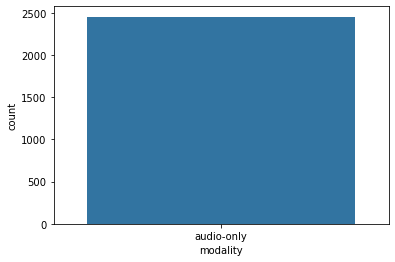

In [23]:
#distribuzione modality  ----> unico valore per modality=audio only
sns.countplot(data=ravdess_df,x='modality')

In [24]:
#conteggio vocal_channel
ravdess_df['vocal_channel'].value_counts()

speech    1335
song       921
Name: vocal_channel, dtype: int64

<AxesSubplot:xlabel='vocal_channel', ylabel='count'>

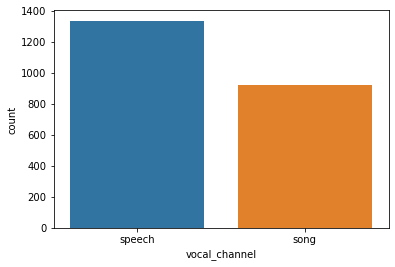

In [25]:
#distribuzione vocal channel --> speech > song
sns.countplot(data=ravdess_df,x='vocal_channel')

In [26]:
#conteggio record per tipologia emozione = variabile target
ravdess_df["emotion"].value_counts()

fearful      376
angry        376
happy        376
calm         376
sad          376
surprised    192
disgust      192
neutral      188
Name: emotion, dtype: int64

<AxesSubplot:xlabel='emotion', ylabel='count'>

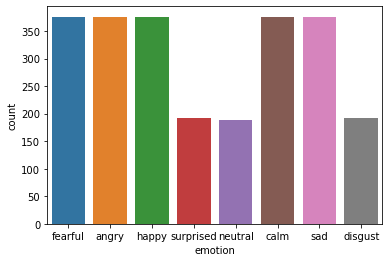

In [27]:
#distribuzione emotions ---> emozioni bilanciate tranne suprised,neutral,disgust(vdere poi crosstab)
sns.countplot(data=ravdess_df,x='emotion')

In [28]:
#conteggio record intensità emozione = variabile target
ravdess_df['emotional_intensity'].value_counts()

normal    1320
strong    1132
Name: emotional_intensity, dtype: int64

<AxesSubplot:xlabel='emotional_intensity', ylabel='count'>

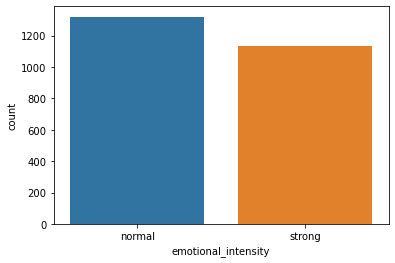

In [29]:
#distribuzione emotional_intensity  ---> quasi bilanciata
sns.countplot(data=ravdess_df,x='emotional_intensity')

In [30]:
#conteggio record statement
ravdess_df['statement'].value_counts()

Dogs are sitting by the door    1226
Kids are talking by the door    1226
Name: statement, dtype: int64

<AxesSubplot:xlabel='statement', ylabel='count'>

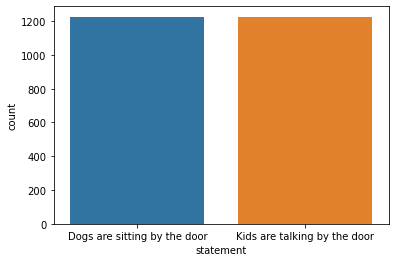

In [31]:
#distribuzione statement ---> perfettamente bilanciata
sns.countplot(data=ravdess_df,x='statement')

In [32]:
#conteggio repetition
ravdess_df['repetition'].value_counts()

2nd    1226
1st    1226
Name: repetition, dtype: int64

<AxesSubplot:xlabel='repetition', ylabel='count'>

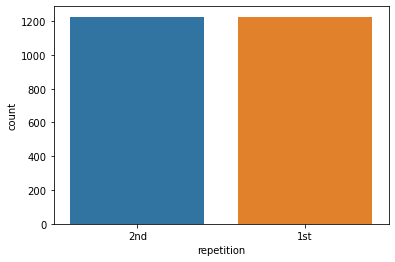

In [33]:
#distribuzione repetition ---> perfettamente bilanciata
sns.countplot(data=ravdess_df, x='repetition')

In [34]:
#conteggio actor
ravdess_df['actor'].value_counts()

22.0    65
12.0    63
14.0    62
20.0    61
8.0     61
19.0    60
13.0    60
2.0     58
16.0    58
24.0    58
5.0     58
10.0    56
21.0    55
11.0    55
6.0     55
17.0    55
4.0     52
3.0     51
1.0     51
7.0     51
23.0    51
9.0     51
15.0    44
18.0    35
Name: actor, dtype: int64

<AxesSubplot:xlabel='actor', ylabel='count'>

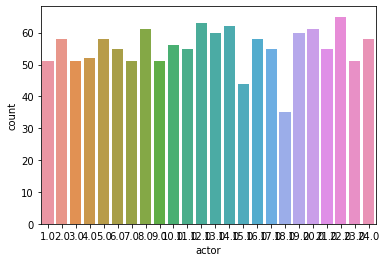

In [35]:
#distribuzione actor
sns.countplot(data=ravdess_df, x='actor')

In [36]:
#conteggio sex
ravdess_df['sex'].value_counts()

M    1248
F    1204
Name: sex, dtype: int64

<AxesSubplot:xlabel='sex', ylabel='count'>

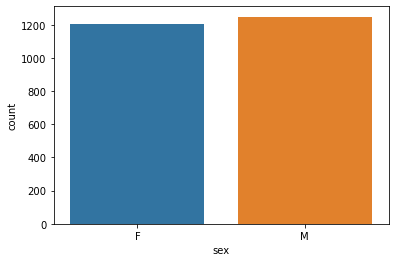

In [37]:
#distribuzione sex  ---> quasi bilanciata perfettamente(12F e 12M)
sns.countplot(data=ravdess_df, x='sex')

In [38]:
# conteggio channels,sample_width,frame_rate,frame_width
print('CHANNELS')  
print(ravdess_df['channels'].value_counts()) # ---> totalmente sbilanciata verso il value=1
print('SAMPLE_WIDTH')
print(ravdess_df['sample_width'].value_counts()) # ---> unico value=2
print('FRAME_RATE')
print(ravdess_df['frame_rate'].value_counts()) # ---> unico value=48000
print('FRAME_WIDTH')
print(ravdess_df['frame_width'].value_counts()) # ---> totalmente sbilanciata verso il value=2

#CONCLUSIONE ----> channels,sample_width,frame_rate. Le suddette feature possono essere cancellate in fase di DATA PREPARATION in quanto contengono valori costanti

CHANNELS
1    2446
2       6
Name: channels, dtype: int64
SAMPLE_WIDTH
2    2452
Name: sample_width, dtype: int64
FRAME_RATE
48000    2452
Name: frame_rate, dtype: int64
FRAME_WIDTH
2    2446
4       6
Name: frame_width, dtype: int64


BOXPLOT  per distribuzione variabili continue 

In [39]:
ravdess_df[ravdess_df["frame_count"]<=0]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
272,audio-only,song,happy,normal,Dogs are sitting by the door,2nd,NaN,F,1,2,...,0.000000,1.0,-0.942975,0.756251,-6.976550e-07,0.023109,-0.145843,0.162659,6.614617,0.050854
300,audio-only,speech,calm,normal,Dogs are sitting by the door,1st,NaN,F,1,2,...,0.000322,1.0,-1.089289,0.374036,-7.148050e-07,0.016256,-0.109406,0.087036,5.302984,-0.423892
455,audio-only,speech,calm,strong,Kids are talking by the door,1st,1.0,M,1,2,...,0.000000,1.0,-0.900937,-0.438346,4.404826e-07,0.002414,-0.016510,0.022736,10.454706,0.538686
458,audio-only,speech,calm,strong,Kids are talking by the door,1st,15.0,M,1,2,...,0.015282,1.0,-1.159614,-0.285414,7.785121e-06,0.005289,-0.066254,0.071503,23.811493,-0.858901
670,audio-only,speech,sad,strong,Kids are talking by the door,1st,4.0,F,1,2,...,0.000000,1.0,-1.380340,0.342158,-2.253620e-07,0.021265,-0.174316,0.193268,8.562913,-0.023027
676,audio-only,speech,happy,normal,Kids are talking by the door,1st,NaN,F,1,2,...,0.000377,1.0,-1.226809,-0.220761,7.220722e-06,0.006063,-0.045197,0.064484,12.625639,0.006728
692,audio-only,speech,sad,strong,Dogs are sitting by the door,1st,24.0,F,1,2,...,0.000000,1.0,-1.181188,0.418227,-2.129253e-07,0.010305,-0.091553,0.121063,12.560777,0.170449
713,audio-only,song,fearful,strong,Kids are talking by the door,1st,NaN,M,1,2,...,0.004952,1.0,-1.196660,0.235288,-5.529279e-06,0.015966,-0.138458,0.153381,14.530791,0.135448
836,audio-only,song,neutral,normal,Kids are talking by the door,1st,NaN,M,1,2,...,0.003542,1.0,-1.417016,0.109997,-2.816245e-06,0.007459,-0.043488,0.047577,5.635349,0.092793
869,audio-only,speech,happy,normal,Dogs are sitting by the door,1st,2.0,F,1,2,...,0.000000,1.0,-1.342223,0.331307,2.369155e-07,0.012115,-0.123383,0.144501,21.449223,0.607727


In [114]:
ravdess_df[ravdess_df["stft_kur"]>=0.5]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
1438,audio-only,NaN,calm,strong,Kids are talking by the door,2nd,6.0,F,1,2,...,0.0,1.0,0.630360,1.378248,-8.130225e-07,0.007213,-0.038147,0.051270,4.376842,0.023654
2159,audio-only,NaN,calm,strong,Kids are talking by the door,1st,9.0,M,1,2,...,0.0,1.0,0.510608,-0.993957,-7.785641e-07,0.000829,-0.010345,0.006500,15.590832,-0.899371
2253,audio-only,song,calm,strong,Dogs are sitting by the door,1st,NaN,F,1,2,...,0.0,1.0,0.794669,1.465815,-2.465882e-06,0.015186,-0.085510,0.096283,4.549264,-0.325173


In [117]:
ravdess_df[ravdess_df["mfcc_max"]>=280]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
1139,audio-only,speech,disgust,strong,Dogs are sitting by the door,2nd,NaN,M,1,2,...,0.013538,1.0,-1.174358,-0.061185,-8.398103e-08,0.005067,-0.054352,0.064697,24.439668,0.155984


In [118]:
ravdess_df[ravdess_df["intensity"]<-60]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
209,audio-only,speech,sad,normal,Dogs are sitting by the door,2nd,9.0,M,1,2,...,0.00000,1.0,-0.587033,-0.561448,-6.556934e-08,0.000669,-0.006134,0.004669,9.387210,-0.639149
241,audio-only,speech,sad,normal,Dogs are sitting by the door,2nd,20.0,F,1,2,...,0.00000,1.0,-1.217463,0.195623,-2.169559e-08,0.000958,-0.008179,0.009399,8.571734,-0.380898
349,audio-only,speech,calm,strong,Dogs are sitting by the door,1st,20.0,F,1,2,...,0.00000,1.0,-1.428535,0.101373,1.083833e-08,0.000946,-0.007904,0.008270,8.912763,-0.380693
1123,audio-only,speech,sad,normal,Kids are talking by the door,1st,NaN,M,1,2,...,0.02322,1.0,-0.739304,-0.423329,-3.390907e-07,0.000652,-0.008301,0.006714,26.547602,-1.164903
2025,audio-only,speech,sad,normal,Kids are talking by the door,2nd,NaN,F,1,2,...,0.00000,1.0,-1.354269,0.276361,-1.841928e-07,0.000692,-0.006195,0.005615,12.292117,-0.481513
2102,audio-only,speech,sad,normal,Kids are talking by the door,2nd,NaN,M,1,2,...,0.00000,1.0,-0.246777,-0.686840,1.343066e-07,0.000787,-0.012634,0.011932,55.833812,-0.455829
2159,audio-only,NaN,calm,strong,Kids are talking by the door,1st,9.0,M,1,2,...,0.00000,1.0,0.510608,-0.993957,-7.785641e-07,0.000829,-0.010345,0.006500,15.590832,-0.899371
2300,audio-only,speech,calm,strong,Kids are talking by the door,1st,20.0,F,1,2,...,0.00000,1.0,-1.496254,0.282624,-2.818736e-07,0.000906,-0.006226,0.006836,9.107498,0.039455
2319,audio-only,speech,calm,normal,Dogs are sitting by the door,1st,NaN,F,1,2,...,0.00000,1.0,-1.525599,0.236063,-1.173562e-06,0.000985,-0.009094,0.008667,11.269584,-0.968646


In [121]:
ravdess_df[ravdess_df["mfcc_std"]>=195]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
1380,audio-only,NaN,calm,strong,Dogs are sitting by the door,2nd,NaN,F,1,2,...,0.0,1.0,-1.523935,0.237599,-0.000001,0.000716,-0.006744,0.006592,7.681586,-0.747001


In [124]:
ravdess_df[ravdess_df["sc_mean"]>7600]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
1687,audio-only,speech,fearful,normal,Dogs are sitting by the door,1st,14.0,F,1,2,...,0.00072,1.0,-1.21613,-0.204859,-0.000001,0.003896,-0.040405,0.041504,8.226836,-0.012286


In [126]:
ravdess_df[ravdess_df["stft_std"]<0.225]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
748,audio-only,speech,calm,strong,Kids are talking by the door,2nd,NaN,M,1,2,...,0.03599,1.0,-0.035547,-0.700473,-3.402044e-07,0.001006,-0.00647,0.007202,5.637361,-0.494131


In [129]:
ravdess_df[ravdess_df["mean"]>0.0010]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
1297,audio-only,song,fearful,strong,Kids are talking by the door,1st,15.0,M,1,2,...,0.007762,1.0,-1.32027,0.13253,0.001223,0.02868,-0.454865,0.29953,16.93824,-0.360361


In [131]:
ravdess_df[ravdess_df["mean"]<-0.0005]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
1797,audio-only,speech,fearful,strong,Kids are talking by the door,1st,NaN,M,1,2,...,0.003637,1.0,-0.826186,-0.644269,-0.000944,0.026629,-0.233795,0.291412,15.353364,-0.710158


In [136]:
ravdess_df[ravdess_df["channels"]!=1]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
287,audio-only,speech,fearful,normal,Kids are talking by the door,2nd,NaN,F,2,2,...,0.000000,1.0,-1.494537,0.209463,-2.893082e-07,0.003710,-0.027496,0.031311,12.807216,-0.357053
778,audio-only,speech,calm,normal,Kids are talking by the door,2nd,1.0,M,2,2,...,0.000000,1.0,-0.903370,-0.457552,8.110521e-07,0.003085,-0.032349,0.028961,19.658056,0.763074
1045,audio-only,speech,surprised,normal,Dogs are sitting by the door,2nd,1.0,M,2,2,...,0.000000,1.0,-1.014021,-0.513559,8.506486e-07,0.006850,-0.041962,0.067474,9.887096,0.756470
1336,audio-only,song,neutral,normal,Kids are talking by the door,1st,24.0,F,2,2,...,0.000000,1.0,-1.211296,0.526725,-6.876912e-07,0.010220,-0.061523,0.066223,6.894591,-0.235057
1348,audio-only,speech,happy,normal,Dogs are sitting by the door,1st,20.0,F,2,2,...,0.000000,1.0,-1.380449,0.032001,-1.419925e-07,0.007949,-0.069214,0.089722,18.307938,0.364011
1809,audio-only,speech,calm,normal,Dogs are sitting by the door,2nd,5.0,M,2,2,...,0.009151,1.0,-1.243703,-0.349210,1.850082e-06,0.002960,-0.025269,0.029419,19.503409,-0.315966


In [139]:
ravdess_df[ravdess_df["frame_width"]!=2]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
287,audio-only,speech,fearful,normal,Kids are talking by the door,2nd,NaN,F,2,2,...,0.000000,1.0,-1.494537,0.209463,-2.893082e-07,0.003710,-0.027496,0.031311,12.807216,-0.357053
778,audio-only,speech,calm,normal,Kids are talking by the door,2nd,1.0,M,2,2,...,0.000000,1.0,-0.903370,-0.457552,8.110521e-07,0.003085,-0.032349,0.028961,19.658056,0.763074
1045,audio-only,speech,surprised,normal,Dogs are sitting by the door,2nd,1.0,M,2,2,...,0.000000,1.0,-1.014021,-0.513559,8.506486e-07,0.006850,-0.041962,0.067474,9.887096,0.756470
1336,audio-only,song,neutral,normal,Kids are talking by the door,1st,24.0,F,2,2,...,0.000000,1.0,-1.211296,0.526725,-6.876912e-07,0.010220,-0.061523,0.066223,6.894591,-0.235057
1348,audio-only,speech,happy,normal,Dogs are sitting by the door,1st,20.0,F,2,2,...,0.000000,1.0,-1.380449,0.032001,-1.419925e-07,0.007949,-0.069214,0.089722,18.307938,0.364011
1809,audio-only,speech,calm,normal,Dogs are sitting by the door,2nd,5.0,M,2,2,...,0.009151,1.0,-1.243703,-0.349210,1.850082e-06,0.002960,-0.025269,0.029419,19.503409,-0.315966


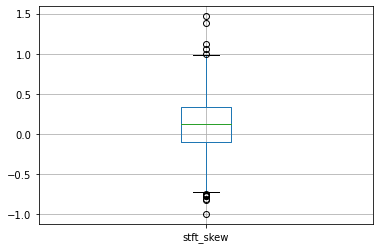

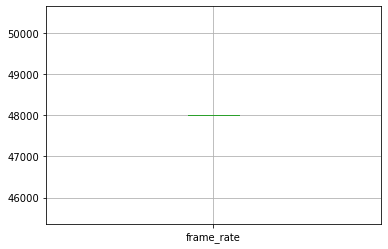

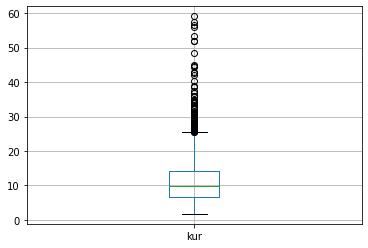

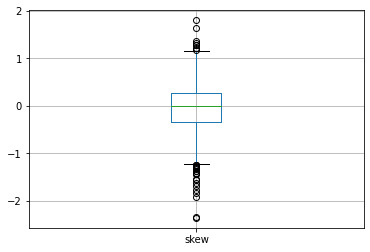

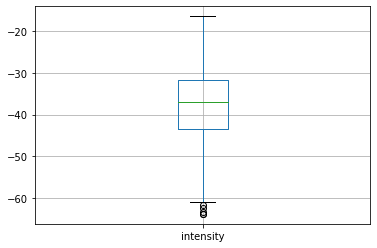

...

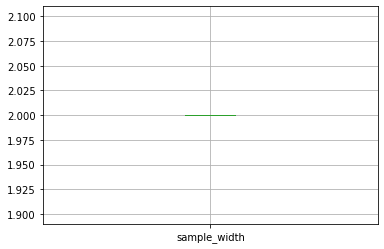

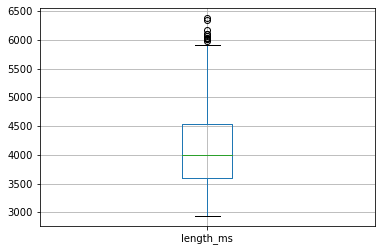

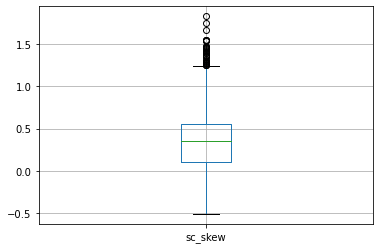

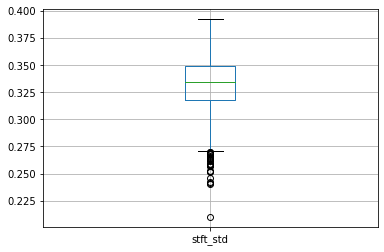

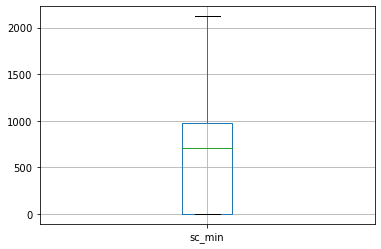

'\nFEATURES CON TUTTI VALORI COSTANTI: frame_rate,stft_max,sample_width\nCONSIDERAZIONI GENERALI: Molti outliers deelle varie feature presentano valore nullo per actor||vocal_channel \nFRame_count:errore di 35 records in frame count--> cancellarli(?)\nStft_kur: 3 outliers > 0.5 CON VOCAL_CHANNEL||ACTOR = null\nmfcc_max: 1 outlier > 280 con actor=NULL\nintensity: 9 outliers < -60 presentano valori nulli con acto || vocal_channel\nmfcc_std: 1 outlier > 195 actor=null\nsc_mean: 1 outlier > 7600 con valore frame_count negativo\nstftd_std: 1 outlier < 0.225 con acotr=null e intensity=null\nmean: 1 outlier > 0.0010 con frame_width=2 ed è una canzone\nmean: 1 outlier < -0.0005 con actor=null e frame_width=2 e intensity=null ed è un parlato\n\n\n'

In [3]:
# serie di box plot per identificare gli outliers

cathegorical_columns = ['modality','vocal_channel','emotion','emotional_intensity','statement','repetition','sex','actor']
columns= ravdess_df.columns
columns2=set(columns)-set(cathegorical_columns) #variabili continue

for s in columns2:
    ravdess_df.boxplot(column=[s])
    plt.show()

"""
FEATURES CON TUTTI VALORI COSTANTI: frame_rate,stft_max,sample_width
CONSIDERAZIONI GENERALI: Molti outliers deelle varie feature presentano valore nullo per actor||vocal_channel 
FRame_count:errore di 35 records in frame count--> cancellarli(?)
Stft_kur: 3 outliers > 0.5 CON VOCAL_CHANNEL||ACTOR = null
mfcc_max: 1 outlier > 280 con actor=NULL
intensity: 9 outliers < -60 presentano valori nulli con acto || vocal_channel
mfcc_std: 1 outlier > 195 actor=null
sc_mean: 1 outlier > 7600 con valore frame_count negativo
stftd_std: 1 outlier < 0.225 con acotr=null e intensity=null
mean: 1 outlier > 0.0010 con frame_width=2 ed è una canzone
mean: 1 outlier < -0.0005 con actor=null e frame_width=2 e intensity=null ed è un parlato


"""

CONFRONTO TRA VARIABILI CATEGORICHE tramite crosstab

In [133]:
cathegorical_columns = ['vocal_channel','emotion','emotional_intensity','statement','repetition','actor','sex']

vocal_emotion = pd.crosstab(ravdess_df['emotion'], ravdess_df['vocal_channel']) 
vocal_intensity = pd.crosstab(ravdess_df['vocal_channel'], ravdess_df['emotional_intensity'])
vocal_statement = pd.crosstab(ravdess_df['vocal_channel'], ravdess_df['statement']) 
vocal_repetition = pd.crosstab(ravdess_df['vocal_channel'], ravdess_df['repetition']) 
vocal_actor=pd.crosstab(ravdess_df['actor'], ravdess_df['vocal_channel']) 
vocal_sex = pd.crosstab(ravdess_df['vocal_channel'], ravdess_df['sex']) 

emotion_intensity = pd.crosstab(ravdess_df['emotion'], ravdess_df['emotional_intensity'])
emotion_statement = pd.crosstab(ravdess_df['emotion'], ravdess_df['statement'])
emotion_repetition = pd.crosstab(ravdess_df['emotion'], ravdess_df['repetition'])
emotion_actor=pd.crosstab(ravdess_df['actor'], ravdess_df['emotion'])
emotion_sex = pd.crosstab(ravdess_df['emotion'], ravdess_df['sex'])

emotional_statement = pd.crosstab(ravdess_df['emotional_intensity'], ravdess_df['statement'])
emotional_repetition = pd.crosstab(ravdess_df['emotional_intensity'], ravdess_df['repetition']) 
emotional_actor = pd.crosstab(ravdess_df['actor'], ravdess_df['emotional_intensity'])
emotional_sex = pd.crosstab(ravdess_df['emotional_intensity'], ravdess_df['sex']) 

statement_repetition = pd.crosstab(ravdess_df['statement'], ravdess_df['repetition']) 
statement_actor = pd.crosstab(ravdess_df['actor'], ravdess_df['statement']) 
statement_sex = pd.crosstab(ravdess_df['statement'], ravdess_df['sex'])

repetition_actor = pd.crosstab(ravdess_df['actor'], ravdess_df['repetition'])
repetition_sex = pd.crosstab(ravdess_df['repetition'], ravdess_df['sex'])

actor_sex=pd.crosstab(ravdess_df['actor'], ravdess_df['sex'])

"""
COMMENTI GENERALI:
vocal_emotion ---> song non presentano emozioni disgust,surprised
vocal_intensity ---> record con intensita normale > record con intensità forte
voal_statement --> record con "dogs are sitting by the door" maggiori sia per canzoni che per parlati
vocal_repetition ---> record con 2th ripetizione > 1th ripetitione
vocal_sex ---> piu maschi che cantano && piu femmine che parlano+

emotion_intensity ---> le 8 emozioni rapportate per i 2 tipi di intensità(normale,forte) sono perfettamente bilanciate tranne per l'emozione NEUTRO che ha intensità solo normale
emotion_statement ---> le 8 emozioni rapportate per i due possibili statement sono perfettamente bilanciate
emotion_repetition ---> le 8 emozioni rapportate per le due possibili ripetizioni sono perfettamente bilanciate
emotion_actor ---> ////
emotion_sex ---> per ogni record di emozione diversa ci sono sempre più interpreti maschi che femmine

emotional_statement ---> le due intensità emozionali rapportate per i due statement sono perfettamente bilanciate
emotional_repetition ---> le due intensità emozionali rapportate per le due possibili ripetizioni sono perfettamente bilanciate
emotional_actor ---> ///
emotional_sex --->  per ognuna intensità emozionale ci sono piu maschi che interpretano i records

statement_repetition ---> ogni frase rapportata per il numero di ripetioni è perfettamente bilanciata
statement_actor ---> ///
statement_sex --->  come per gli altri casi, ogni frase è interpretata da piu maschi che femmine

repetition_actor ---> ///
repetition_sex ---> come al solito ci sono piu maschi per ogni tipo di ripetizione 

actor_sex ---> gli attori con indice dispari sono maschi mentre quelli con indice pari sono femmine

"""

'\nCOMMENTI GENERALI:\nvocal_emotion ---> song non presentano emozioni disgust,surprised\nvocal_intensity ---> record con intensita normale > record con intensità forte\nvoal_statement --> record con "dogs are sitting by the door" maggiori sia per canzoni che per parlati\nvocal_repetition ---> record con 2th ripetizione > 1th ripetitione\nvocal_sex ---> piu maschi che cantano && piu femmine che parlano+\n\nemotion_intensity ---> le 8 emozioni rapportate per i 2 tipi di intensità(normale,forte) sono perfettamente bilanciate tranne per l\'emozione NEUTRO che ha intensità solo normale\nemotion_statement ---> le 8 emozioni rapportate per i due possibili statement sono perfettamente bilanciate\nemotion_repetition ---> le 8 emozioni rapportate per le due possibili ripetizioni sono perfettamente bilanciate\nemotion_actor ---> ////\nemotion_sex ---> per ogni record di emozione diversa ci sono sempre più interpreti maschi che femmine\n\nemotional_statement ---> le due intensità emozionali rappo

In [42]:
vocal_emotion

vocal_channel,song,speech
emotion,,
angry,169,182
calm,169,182
disgust,0,179
fearful,166,169
happy,163,180
neutral,85,87
sad,169,175
surprised,0,181


<AxesSubplot:xlabel='emotion'>

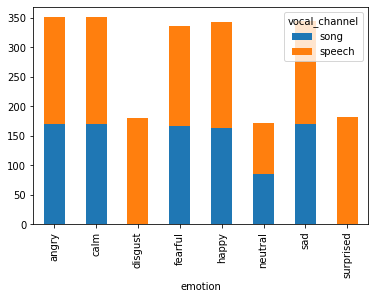

In [43]:
vocal_emotion.plot(kind = 'bar', stacked =True)

In [44]:
vocal_intensity

emotional_intensity,normal,strong
vocal_channel,,
song,502,419
speech,717,618


<AxesSubplot:xlabel='vocal_channel'>

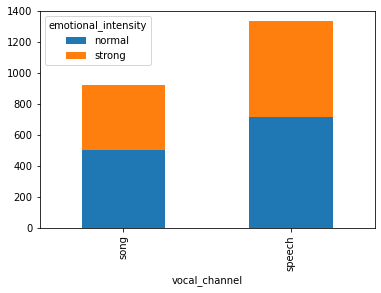

In [45]:
vocal_intensity.plot(kind = 'bar', stacked =True)

In [46]:
vocal_statement

statement,Dogs are sitting by the door,Kids are talking by the door
vocal_channel,,
song,464,457
speech,671,664


<AxesSubplot:xlabel='vocal_channel'>

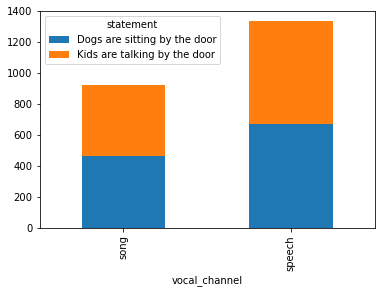

In [47]:
vocal_statement.plot(kind = 'bar', stacked =True)

In [48]:
vocal_repetition

repetition,1st,2nd
vocal_channel,,
song,455,466
speech,664,671


<AxesSubplot:xlabel='vocal_channel'>

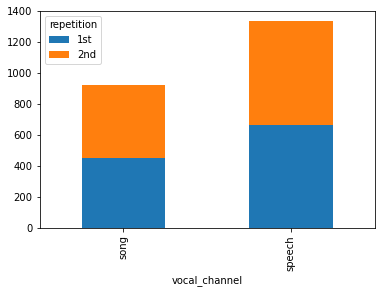

In [49]:
vocal_repetition.plot(kind = 'bar', stacked =True)

In [50]:
vocal_actor

vocal_channel,song,speech
actor,,
1.0,23,25
2.0,19,33
3.0,19,28
4.0,21,27
5.0,25,28
6.0,22,30
7.0,22,24
8.0,21,35
9.0,17,31


<AxesSubplot:xlabel='actor'>

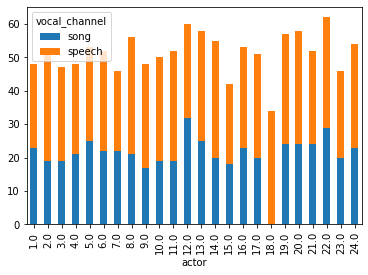

In [51]:
vocal_actor.plot(kind = 'bar', stacked =True)

In [52]:
vocal_sex

sex,F,M
vocal_channel,,
song,434,487
speech,671,664


<AxesSubplot:xlabel='vocal_channel'>

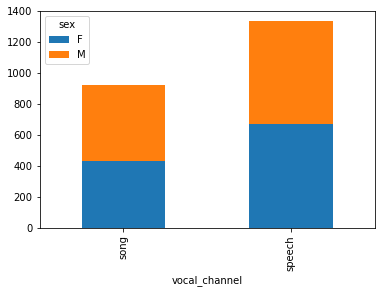

In [53]:
vocal_sex.plot(kind = 'bar', stacked =True)

In [54]:
emotion_intensity

emotional_intensity,normal,strong
emotion,,
angry,188,188
calm,188,188
disgust,96,96
fearful,188,188
happy,188,188
neutral,188,0
sad,188,188
surprised,96,96


<AxesSubplot:xlabel='emotion'>

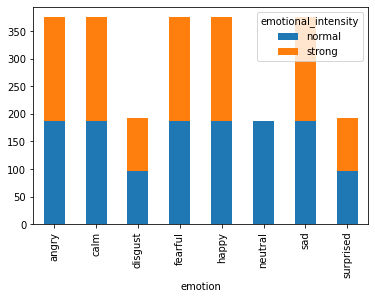

In [55]:
emotion_intensity.plot(kind = 'bar', stacked =True)

In [56]:
emotion_statement

statement,Dogs are sitting by the door,Kids are talking by the door
emotion,,
angry,188,188
calm,188,188
disgust,96,96
fearful,188,188
happy,188,188
neutral,94,94
sad,188,188
surprised,96,96


<AxesSubplot:xlabel='emotion'>

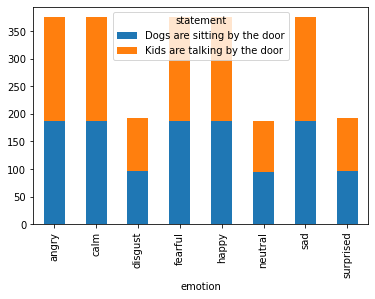

In [57]:
emotion_statement.plot(kind = 'bar', stacked =True)

In [58]:
emotion_repetition

repetition,1st,2nd
emotion,,
angry,188,188
calm,188,188
disgust,96,96
fearful,188,188
happy,188,188
neutral,94,94
sad,188,188
surprised,96,96


<AxesSubplot:xlabel='emotion'>

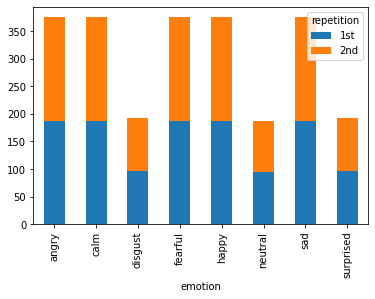

In [59]:
emotion_repetition.plot(kind = 'bar', stacked =True)

In [60]:
emotion_actor

emotion,angry,calm,disgust,fearful,happy,neutral,sad,surprised
actor,,,,,,,,
1.0,7,10,4,8,6,6,6,4
2.0,10,6,5,9,12,6,6,4
3.0,7,9,4,7,6,3,10,5
4.0,8,8,4,10,6,3,9,4
5.0,6,10,5,9,9,4,9,6
6.0,8,11,2,9,10,2,9,4
7.0,9,7,4,10,9,2,6,4
8.0,5,9,7,14,8,5,8,5
9.0,6,7,6,6,9,5,9,3


<AxesSubplot:xlabel='actor'>

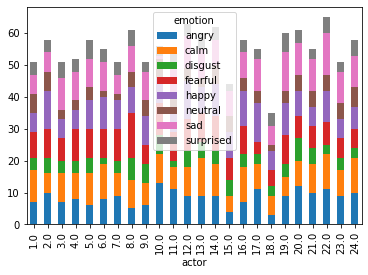

In [61]:
emotion_actor.plot(kind = 'bar', stacked =True)

In [62]:
emotion_sex

sex,F,M
emotion,,
angry,184,192
calm,184,192
disgust,96,96
fearful,184,192
happy,184,192
neutral,92,96
sad,184,192
surprised,96,96


<AxesSubplot:xlabel='emotion'>

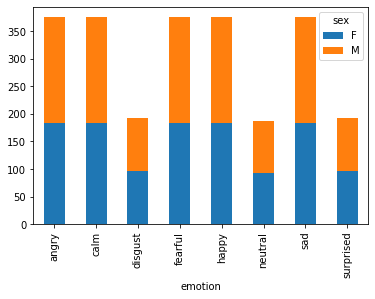

In [63]:
emotion_sex.plot(kind = 'bar', stacked =True)

In [64]:
emotional_statement

statement,Dogs are sitting by the door,Kids are talking by the door
emotional_intensity,,
normal,660,660
strong,566,566


<AxesSubplot:xlabel='emotional_intensity'>

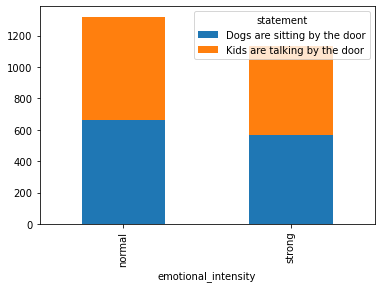

In [65]:
emotional_statement.plot(kind = 'bar', stacked =True)

In [66]:
emotional_repetition

repetition,1st,2nd
emotional_intensity,,
normal,660,660
strong,566,566


<AxesSubplot:xlabel='emotional_intensity'>

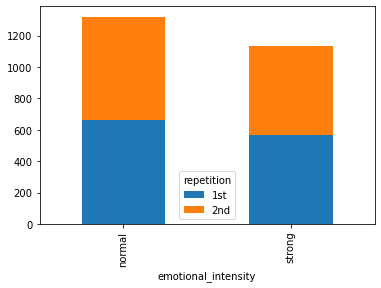

In [67]:
emotional_repetition.plot(kind = 'bar', stacked =True)

In [68]:
emotional_actor

emotional_intensity,normal,strong
actor,,
1.0,28,23
2.0,29,29
3.0,24,27
4.0,27,25
5.0,35,23
6.0,29,26
7.0,27,24
8.0,32,29
9.0,26,25


<AxesSubplot:xlabel='actor'>

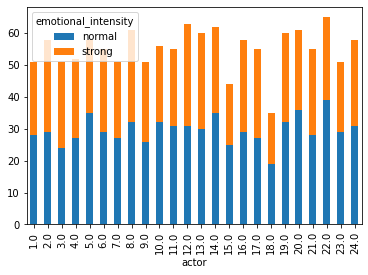

In [69]:
emotional_actor.plot(kind = 'bar', stacked =True)

In [70]:
emotional_sex

sex,F,M
emotional_intensity,,
normal,648,672
strong,556,576


<AxesSubplot:xlabel='emotional_intensity'>

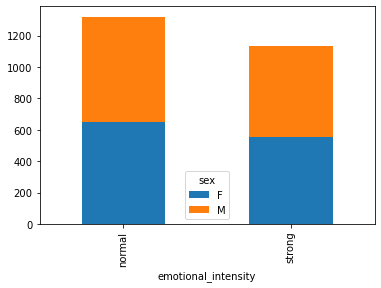

In [71]:
emotional_sex.plot(kind = 'bar', stacked =True)

In [72]:
statement_repetition

repetition,1st,2nd
statement,,
Dogs are sitting by the door,613,613
Kids are talking by the door,613,613


<AxesSubplot:xlabel='statement'>

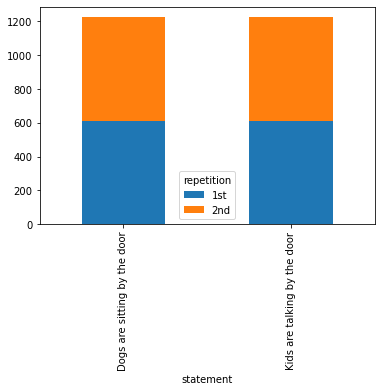

In [73]:
statement_repetition.plot(kind = 'bar', stacked =True)

In [74]:
statement_actor

statement,Dogs are sitting by the door,Kids are talking by the door
actor,,
1.0,27,24
2.0,30,28
3.0,28,23
4.0,29,23
5.0,29,29
6.0,23,32
7.0,23,28
8.0,28,33
9.0,19,32


<AxesSubplot:xlabel='actor'>

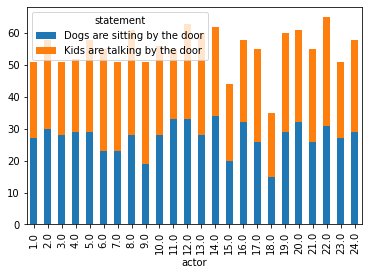

In [75]:
statement_actor.plot(kind = 'bar', stacked =True)

In [76]:
statement_sex

sex,F,M
statement,,
Dogs are sitting by the door,602,624
Kids are talking by the door,602,624


<AxesSubplot:xlabel='statement'>

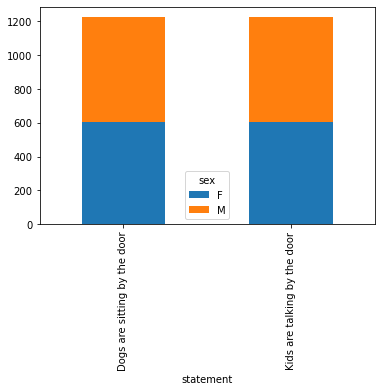

In [77]:
statement_sex.plot(kind = 'bar', stacked =True)

In [78]:
repetition_actor

repetition,1st,2nd
actor,,
1.0,26,25
2.0,31,27
3.0,26,25
4.0,26,26
5.0,24,34
6.0,31,24
7.0,27,24
8.0,27,34
9.0,23,28


<AxesSubplot:xlabel='actor'>

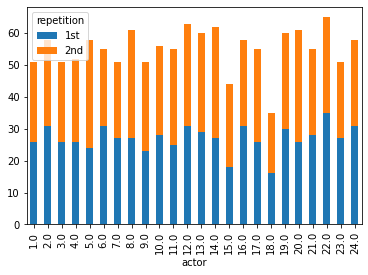

In [79]:
repetition_actor.plot(kind = 'bar', stacked =True)

In [80]:
repetition_sex

sex,F,M
repetition,,
1st,602,624
2nd,602,624


<AxesSubplot:xlabel='repetition'>

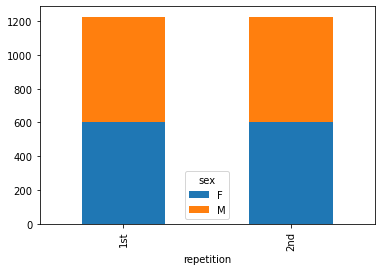

In [81]:
repetition_sex.plot(kind = 'bar', stacked =True)

In [134]:
actor_sex

sex,F,M
actor,,
1.0,0,51
2.0,58,0
3.0,0,51
4.0,52,0
5.0,0,58
6.0,55,0
7.0,0,51
8.0,61,0
9.0,0,51


<AxesSubplot:xlabel='actor'>

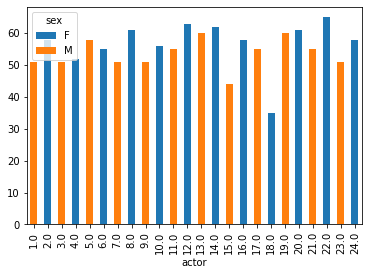

In [135]:
actor_sex.plot(kind = 'bar', stacked =True)

BOXPLOT TRA VARIABILI CONTINUE E CATEGORICHE

d:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\tools.py:223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(**fig_kw)


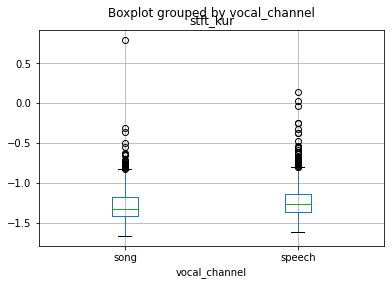

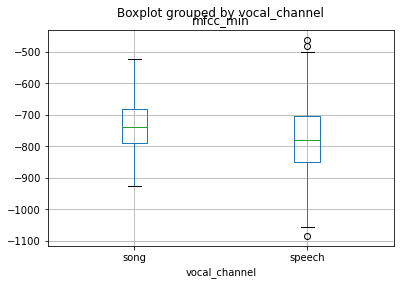

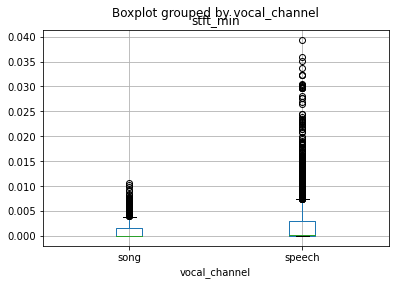

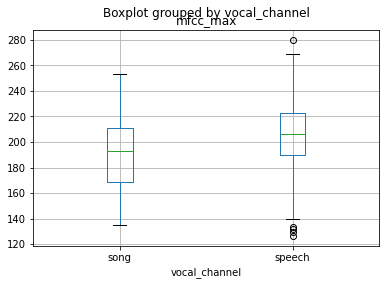

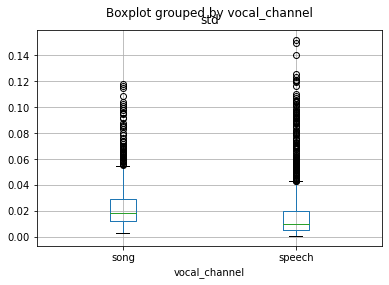

...

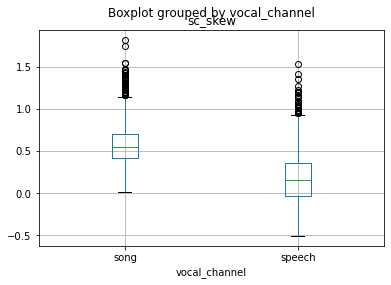

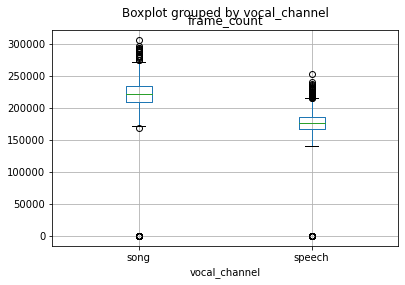

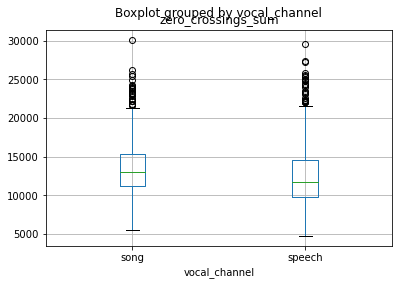

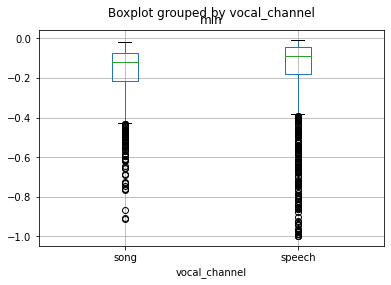

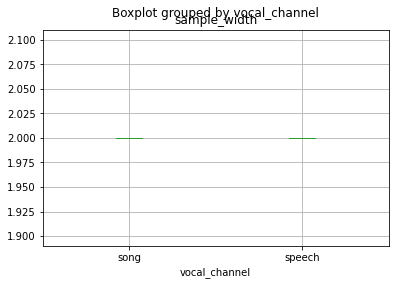

In [82]:
# VOCAL_CHANNEL
for s in columns2:
  ravdess_df.boxplot(column=[s], by='vocal_channel')

"""
- boxplot tra vocal_channel e lenght_ms presenta che  durata canzoni > durata parlato in media
- boxplot tra vocal_channel e frame_count ---> piu lungo è il file audio più frame_count presente
"""

d:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\tools.py:223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(**fig_kw)


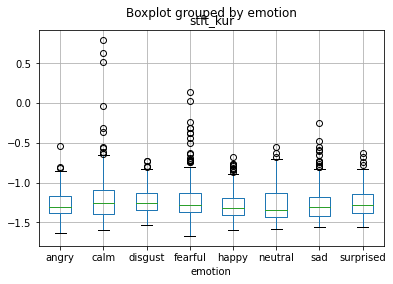

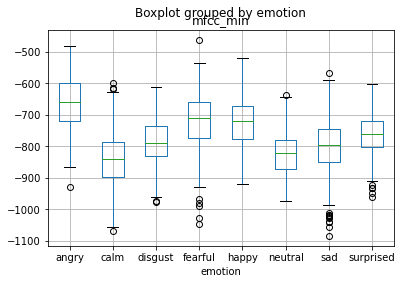

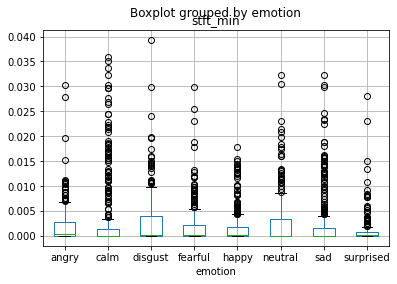

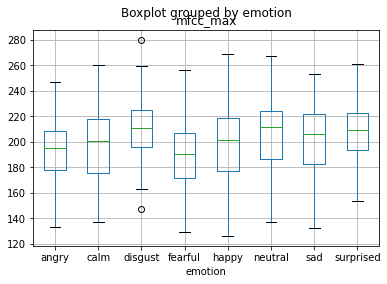

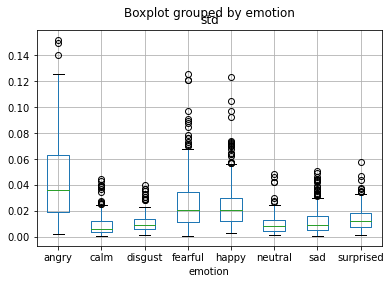

...

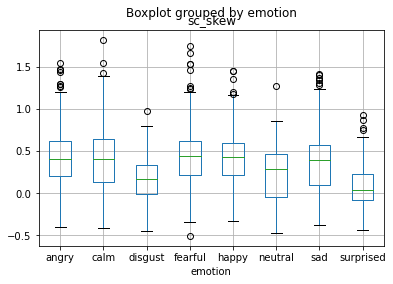

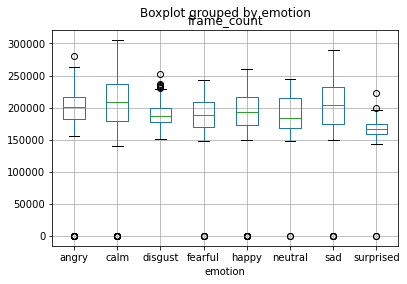

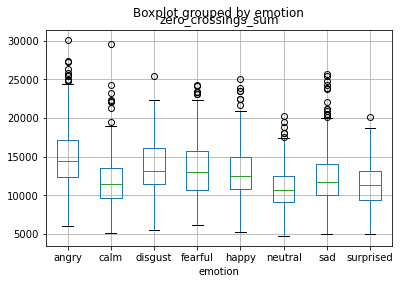

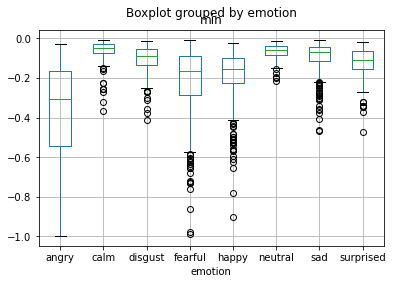

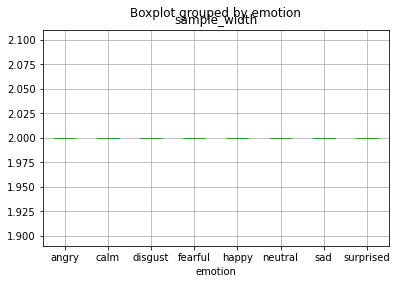

In [83]:
#EMOTION
for s in columns2:
  ravdess_df.boxplot(column=[s], by='emotion') 

  """
  boxplot tra emotion e channels ---> gli outliers con channels=2 e frame_width=4 appartengono alle seguenti emozioni: calm,fearful,happy,neutral,surprised
  boxplot tra emotion e max ---> i valori massimi dei records sono relativi prevalentemente ai record con emozione=angry
  boxplot tra emotion e mean ---> i due outliers sono relativi all'emozione=fearful
  boxplot tra emotion e min ---> i valori minimi dei records sono relativi prevalentemente ai record con emozione=angry
  """

d:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\tools.py:223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(**fig_kw)


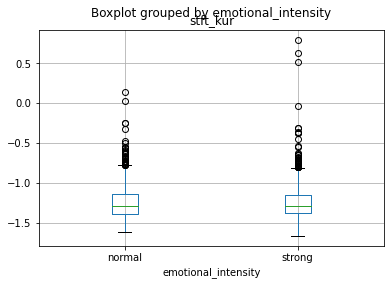

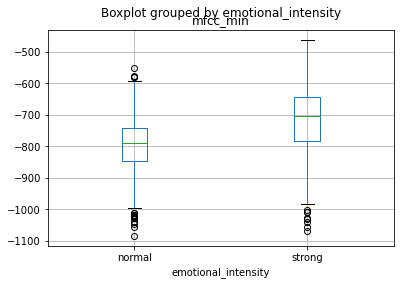

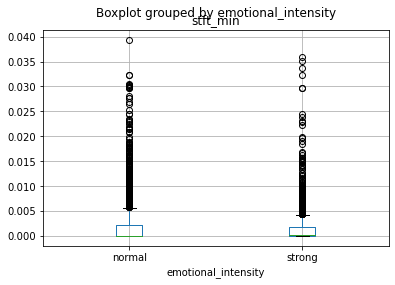

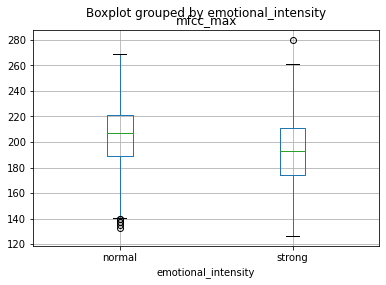

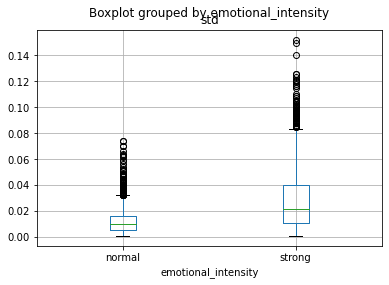

...

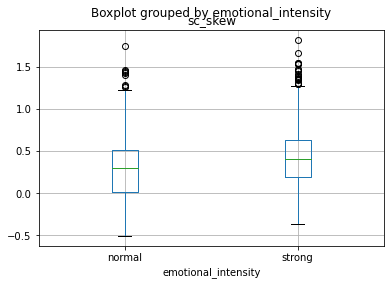

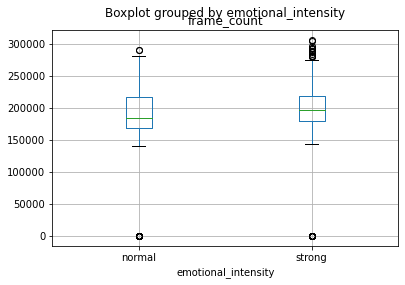

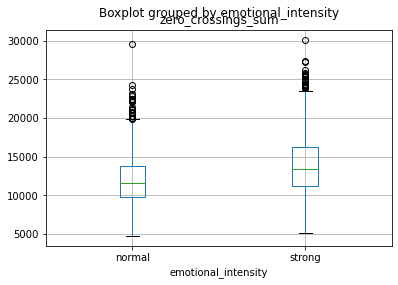

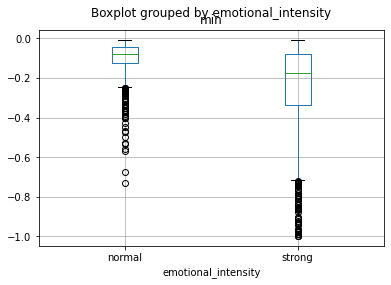

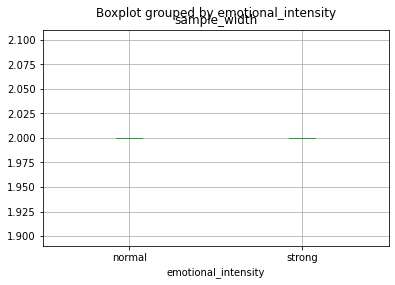

In [84]:
#EMOTIONAL_INTENSITY
for s in columns2:
  ravdess_df.boxplot(column=[s], by='emotional_intensity')

"""
boxplot tra emotional_intensity e channel ---> Gli outliers(6) con channels=2 sono relativi all emotional_intensity=normal
boxplot tra emotional_intensity e frame_width ---> Gli outliers(6) con frame_width=4 sono relativi all emotional_intensity=normal
"""

In [4]:
ravdess_df[ravdess_df["stft_kur"]>0.5]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
1438,audio-only,NaN,calm,strong,Kids are talking by the door,2nd,6.0,F,1,2,...,0.0,1.0,0.630360,1.378248,-8.130225e-07,0.007213,-0.038147,0.051270,4.376842,0.023654
2159,audio-only,NaN,calm,strong,Kids are talking by the door,1st,9.0,M,1,2,...,0.0,1.0,0.510608,-0.993957,-7.785641e-07,0.000829,-0.010345,0.006500,15.590832,-0.899371
2253,audio-only,song,calm,strong,Dogs are sitting by the door,1st,NaN,F,1,2,...,0.0,1.0,0.794669,1.465815,-2.465882e-06,0.015186,-0.085510,0.096283,4.549264,-0.325173


In [5]:
ravdess_df[ravdess_df["mfcc_max"]>275]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
1139,audio-only,speech,disgust,strong,Dogs are sitting by the door,2nd,NaN,M,1,2,...,0.013538,1.0,-1.174358,-0.061185,-8.398103e-08,0.005067,-0.054352,0.064697,24.439668,0.155984


In [7]:
ravdess_df[ravdess_df["mfcc_std"]>195]

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
1380,audio-only,NaN,calm,strong,Dogs are sitting by the door,2nd,NaN,F,1,2,...,0.0,1.0,-1.523935,0.237599,-0.000001,0.000716,-0.006744,0.006592,7.681586,-0.747001


d:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\tools.py:223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(**fig_kw)


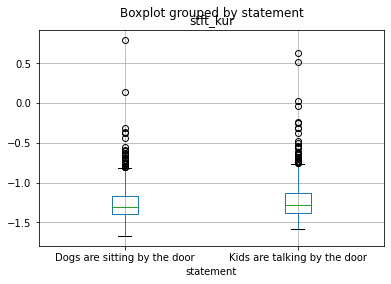

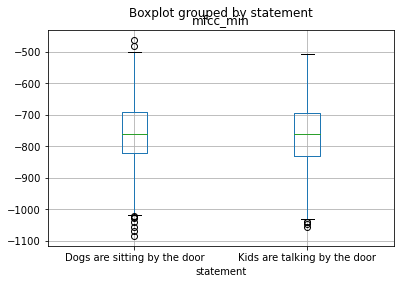

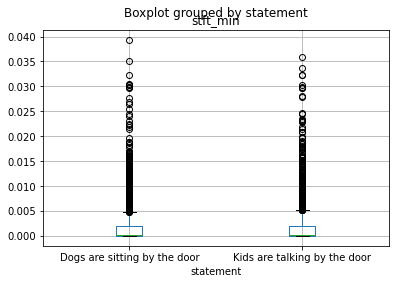

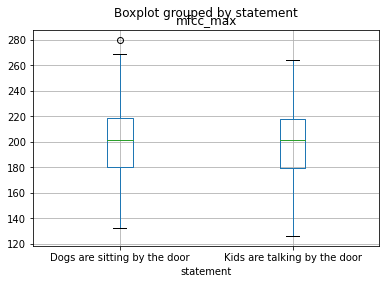

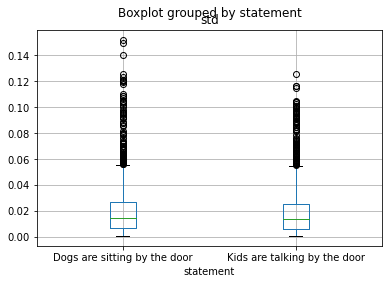

...

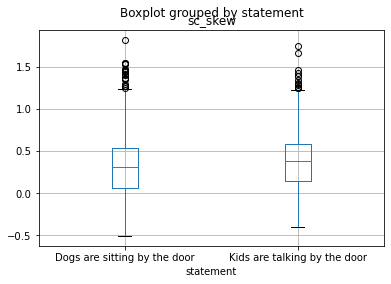

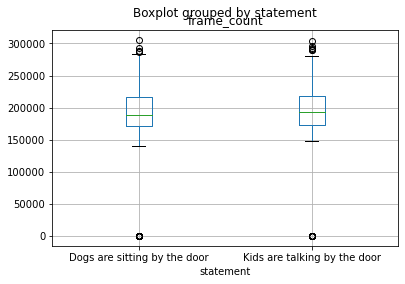

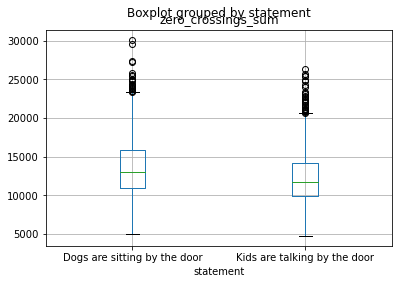

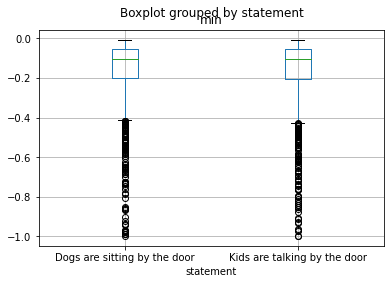

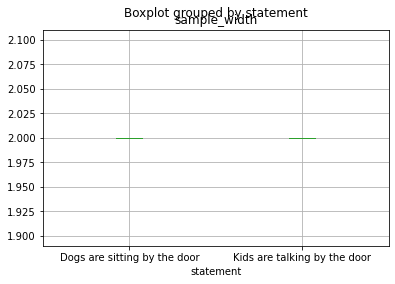

In [85]:
#STATEMENT
for s in columns2:
  ravdess_df.boxplot(column=[s], by='statement')

"""
boxplot tra statement e stft_kur ---> 3 outliers > 0.5 con vocal_channel||Actor=NULL
boxplot tra statement e mfcc_max ---> 1 outlier > 275 con actor=NULL
boxplot tra statement e mfcc_std ---> 1 outlier > 195 con vocal_channel||actor=NULL 

"""

d:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\tools.py:223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(**fig_kw)


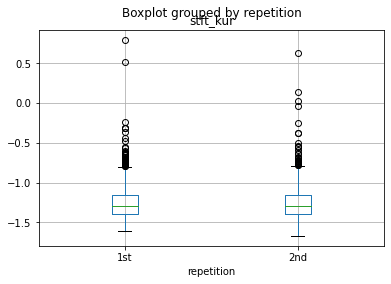

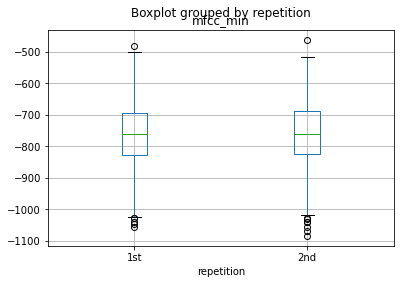

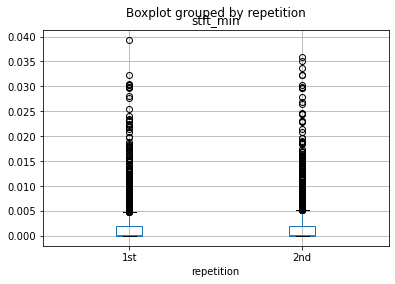

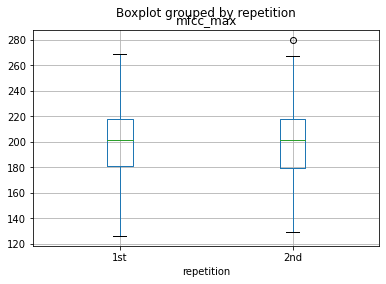

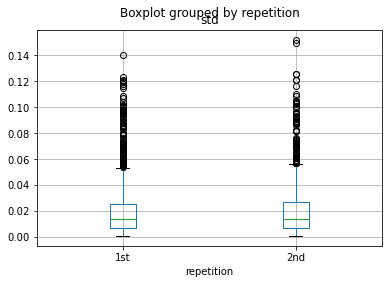

...

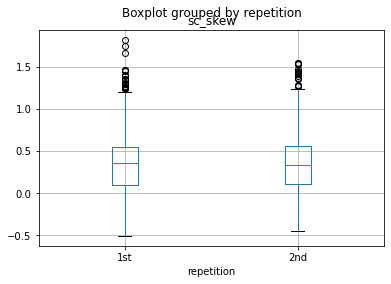

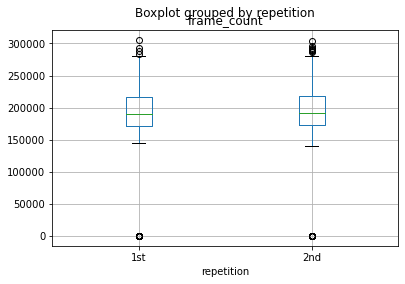

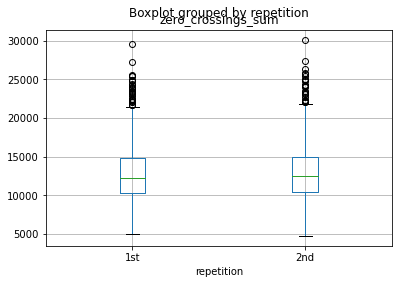

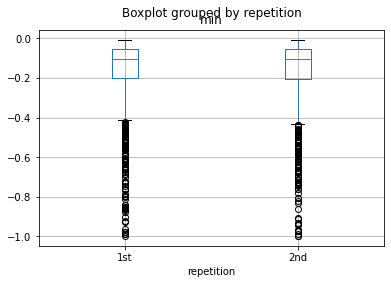

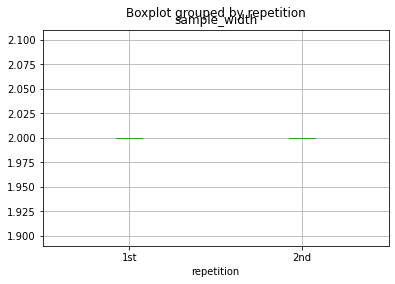

In [86]:
#REPETITION
for s in columns2:
  ravdess_df.boxplot(column=[s], by='repetition')

"""

"""

d:\Anaconda\lib\site-packages\pandas\plotting\_matplotlib\tools.py:223: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(**fig_kw)


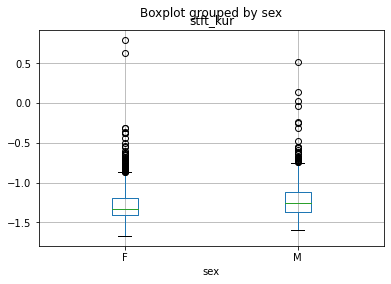

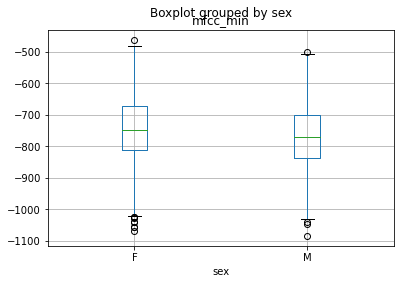

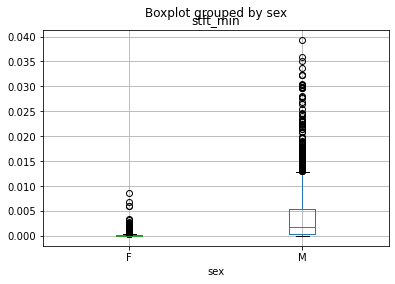

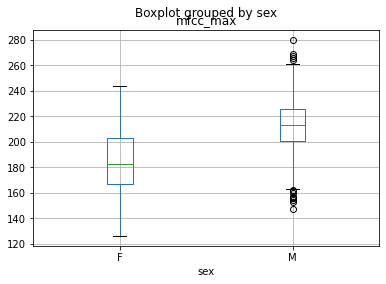

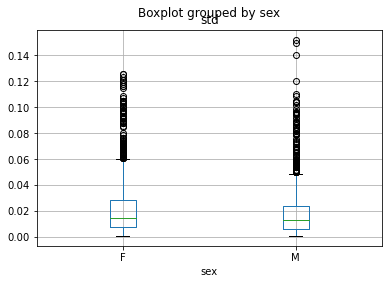

...

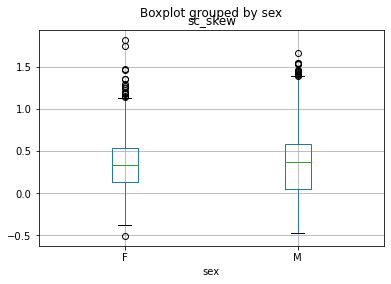

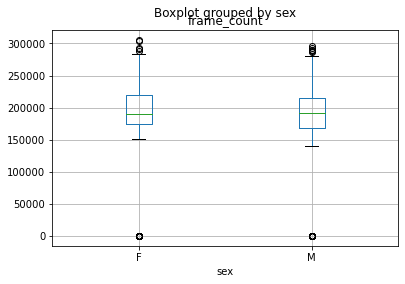

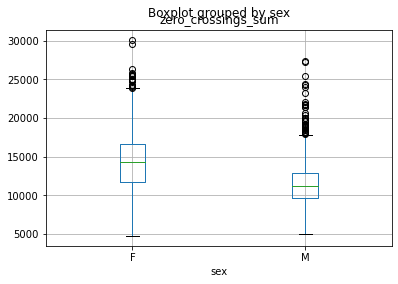

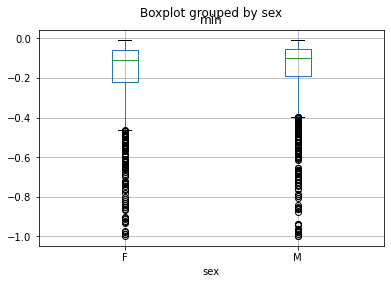

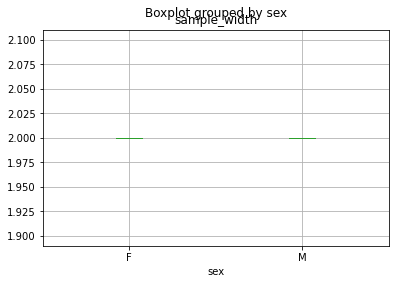

In [87]:
#SEX
for s in columns2:
  ravdess_df.boxplot(column=[s], by='sex')

"""
boxplot tra sex e stft_min ---> record interpretati da femmine hanno un stft_min tendente principalmente a 0

"""  

PAIRPLOT DI TUTTE LE VARIABILI CON VARIABILE TARGET=EMOTION

In [88]:
#sns.pairplot(data=ravdess_df, hue='emotion')
#plt.show()

PAIRPLOT DI TUTTE LE VARIABILI CON VARIABILE TARGET=EMOTIONAL_INTENSITY

In [89]:
#sns.pairplot(data=ravdess_df, hue='emotional_intensity')
#plt.show()

CORRELATION MATRIX

In [90]:
"""
Perfetta correlazione positiva
Quando trovo R = +1 significa che, al crescere della variabile X, il fenomeno Y cresce linearmente. Vuol dire, inoltre, che Y dipende totalmente da X, e ogni qualvolta si aumenterà di un'unità la X, la Y crescerà del coefficiente angolare della retta

Perfetta correlazione negativa
Quando trovo R = -1 significa che, al crescere della variabile X, il fenomeno Y decresce linearmente. Vuol dire inoltre che Y dipende totalmente da X, e ogni qualvolta si aumenterà di un'unità la X, la Y descrescerà del coefficiente angolare della retta.


CORRELAZIONE TENDENTE A 1:

(Lenght_ms,Vocal_channel)=0.781
(Channel,Frame_width)=1.000
(Frame_count,Lenght_ms)=0.762
(Intensity,Mfcc_min)=0.973
(Intensity,Std)=0.845
(Intensity,Max)=0.808
(Min,Mfcc_std)=0.816
(Std,Mfcc_min)=0.842
(Max,Mfcc_min)=0.822
(Max,std)=0.952


CORRELAZIONE TENDENTE A -1:

(intensity,mfcc_std) = -0.97
(intensity , min) = -0.81
(intensity ,mfc_min) = -0.97
(mfcc_std,std) = -0.84
(mfcc_std,max) = -0.81
(mfcc_min,min) = -0.82
(sc_mean,sc_skew) = -0.82

NAN(a causa di valori costanti):

sample width , frame_rate,stft_max, modality

"""
ravdess_df.corr(method="pearson").style.background_gradient(cmap='coolwarm', vmin=-1, vmax=1)




,actor,channels,sample_width,frame_rate,frame_width,length_ms,frame_count,intensity,zero_crossings_sum,mfcc_mean,mfcc_std,mfcc_min,mfcc_max,sc_mean,sc_std,sc_min,sc_max,sc_kur,sc_skew,stft_mean,stft_std,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
actor,1.000000,-0.021199,nan,nan,-0.021199,0.043038,0.039325,0.061923,-0.059671,-0.065308,-0.012426,0.045965,-0.028036,0.060292,0.119453,-0.046160,0.083882,-0.132716,-0.066964,-0.039657,0.082993,0.027860,nan,-0.064000,0.007862,0.020220,0.032818,-0.009776,0.015928,-0.023939,0.065606
channels,-0.021199,1.000000,nan,nan,1.000000,-0.011438,-0.005109,-0.058387,-0.039588,-0.058672,0.055940,-0.045564,0.025047,0.056692,0.062773,-0.038106,0.017277,-0.041518,-0.048661,0.025579,-0.015658,-0.007655,nan,0.009364,-0.030689,0.000447,-0.034657,0.034420,-0.032340,0.024764,0.022957
sample_width,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
frame_rate,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan
frame_width,-0.021199,1.000000,nan,nan,1.000000,-0.011438,-0.005109,-0.058387,-0.039588,-0.058672,0.055940,-0.045564,0.025047,0.056692,0.062773,-0.038106,0.017277,-0.041518,-0.048661,0.025579,-0.015658,-0.007655,nan,0.009364,-0.030689,0.000447,-0.034657,0.034420,-0.032340,0.024764,0.022957
length_ms,0.043038,-0.011438,nan,nan,-0.011438,1.000000,0.762874,0.293782,0.329517,0.011321,-0.302735,0.205996,-0.347253,-0.546234,-0.182306,-0.077001,-0.118781,0.292127,0.621148,-0.561395,0.409380,-0.245511,nan,-0.072309,0.602057,0.004213,0.167134,-0.070644,0.072309,-0.460723,0.064473
frame_count,0.039325,-0.005109,nan,nan,-0.005109,0.762874,1.000000,0.215516,0.232289,0.002837,-0.226994,0.151464,-0.271507,-0.421151,-0.140110,-0.063856,-0.107906,0.231393,0.483005,-0.429014,0.322356,-0.184323,nan,-0.062620,0.458971,0.007974,0.119598,-0.045295,0.044480,-0.347097,0.034491
intensity,0.061923,-0.058387,nan,nan,-0.058387,0.293782,0.215516,1.000000,0.497906,0.610094,-0.978744,0.973981,-0.386237,-0.333510,-0.440724,0.110529,-0.223566,0.369371,0.418625,-0.355795,0.254968,-0.277603,nan,-0.082772,0.391700,0.016175,0.845225,-0.810253,0.808436,-0.174999,0.411307
zero_crossings_sum,-0.059671,-0.039588,nan,nan,-0.039588,0.329517,0.232289,0.497906,1.000000,0.130454,-0.559115,0.500559,-0.448745,-0.072949,-0.373711,0.190178,-0.040921,0.186598,0.140215,-0.406511,0.115175,-0.195173,nan,0.072706,0.445898,0.020279,0.470125,-0.420933,0.417493,-0.118101,0.201108
mfcc_mean,-0.065308,-0.058672,nan,nan,-0.058672,0.011321,0.002837,0.610094,0.130454,1.000000,-0.620080,0.606989,0.172355,-0.282160,-0.593395,0.400838,-0.375264,0.357717,0.253241,0.312525,-0.354091,0.199302,nan,0.019601,-0.185246,0.005491,0.565188,-0.591475,0.583417,0.112305,0.053027


SCATTER PLOT DI TUTTE LE CORRELAZIONI ALTE IDENTIFICATE(HUE=TUTTE LE FEAUTRES CATEGORICHE)

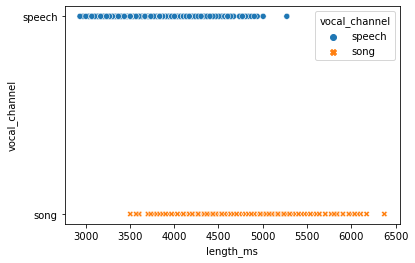

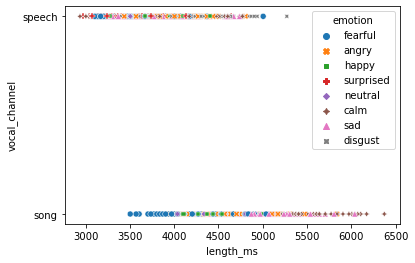

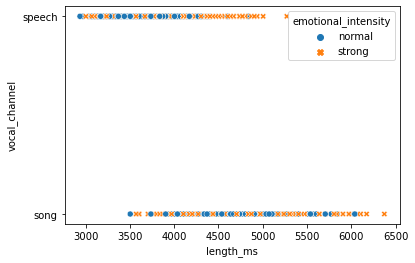

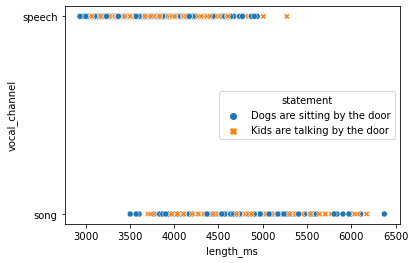

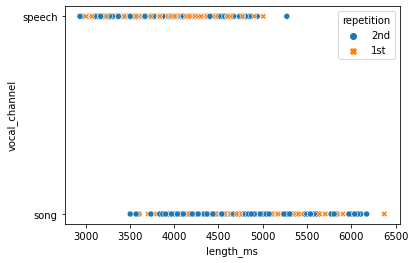

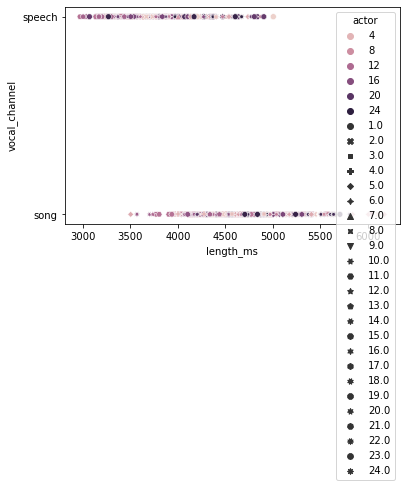

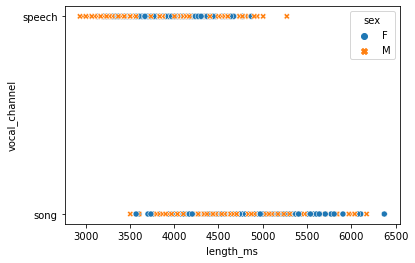

In [91]:
#corr(length_ms,vocal channel)=0.781
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="length_ms", y="vocal_channel", hue=s, style=s)
  plt.show()

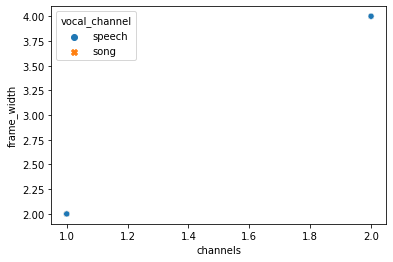

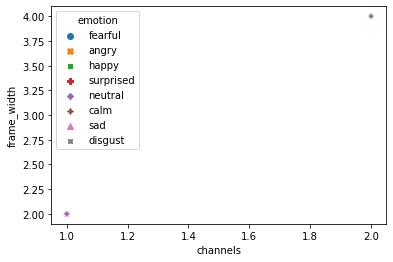

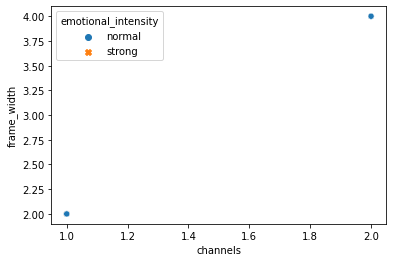

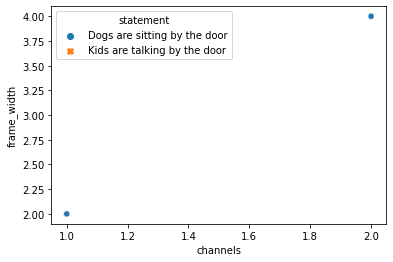

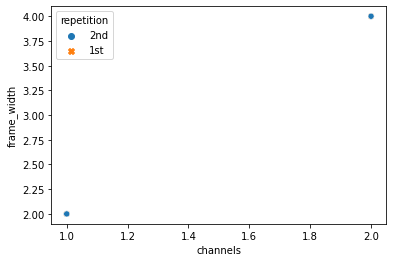

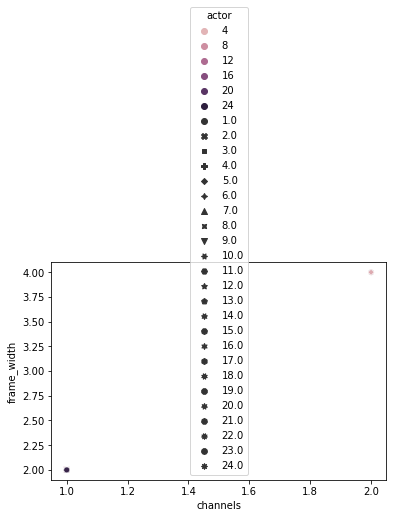

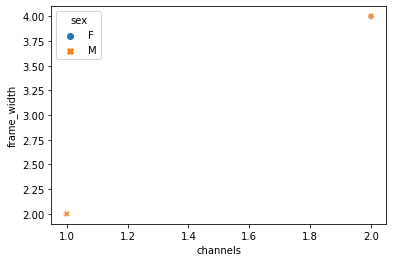

In [92]:
#corr(channels,frame_width)=1
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="channels", y="frame_width", hue=s, style=s)
  plt.show()

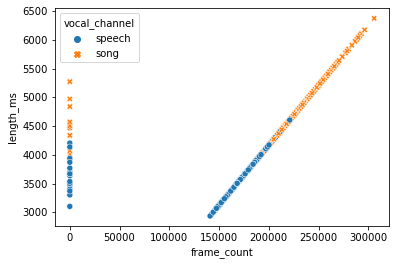

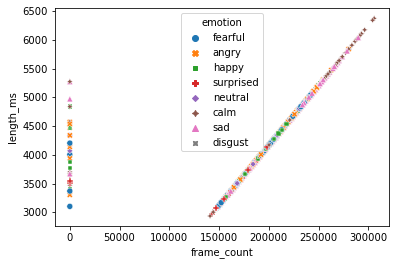

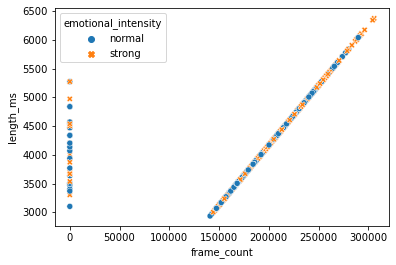

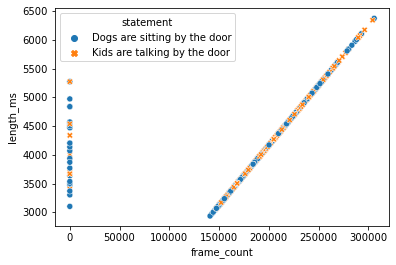

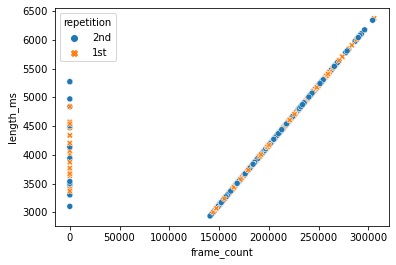

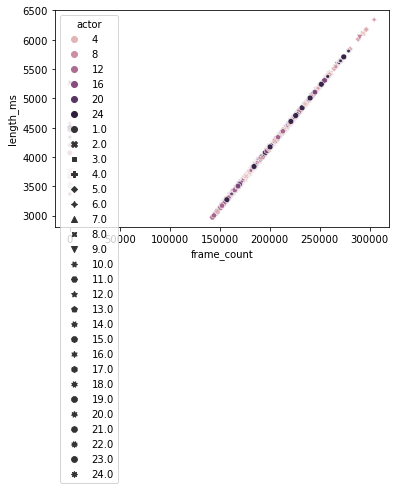

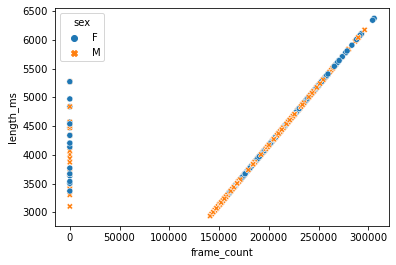

In [93]:
#corr(frame_count,length_ms)=0.762
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="frame_count", y="length_ms", hue=s, style=s)
  plt.show()

"""
scatterplot tra frame_count,length_ms,vocal_channel ----> per le canzoni gli audio sono piu lunghi e di conseguenza frame_count maggiore rispetto ai parlati 
scatterplot tra frame_count,length_ms,emotions ---> gli audio piu lunghi e con maggiore frame_count sono relativi agli audio con emozione=calma||tristezza, di conseguenza possiamo dedurre che gli audio cantati nel range frame_count >250000 hanno come emozione=calma|| tristezza
 
"""

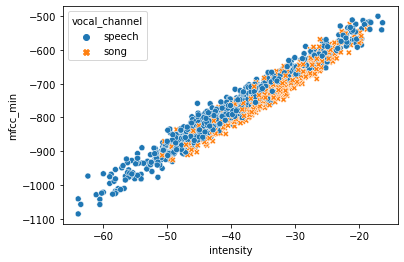

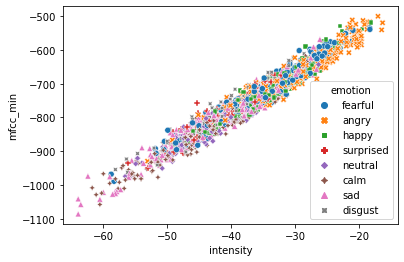

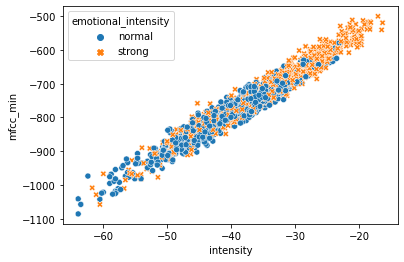

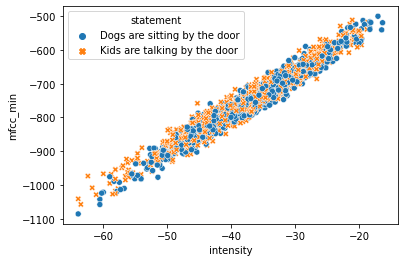

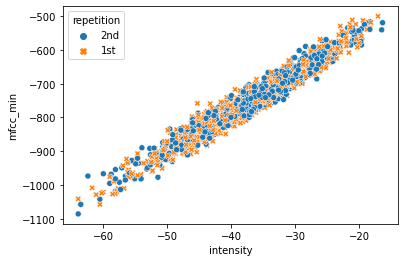

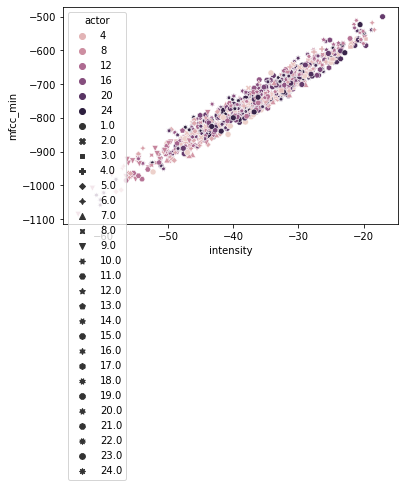

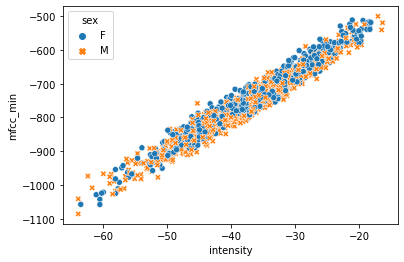

In [94]:
#corr(intensity,mfcc_min)=0.973
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="intensity", y="mfcc_min", hue=s, style=s)
  plt.show()

"""
scatter tra intensity,mfcc_min,emotional_intensity ---> a valori alti di intensità edi mfcc_min si hanno record con prevalenza intensità emozionale=strong
"""

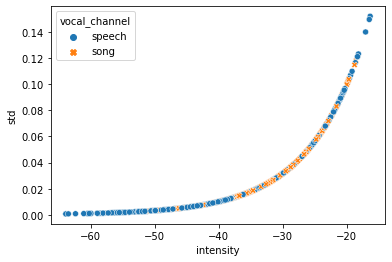

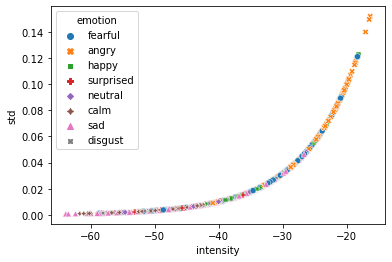

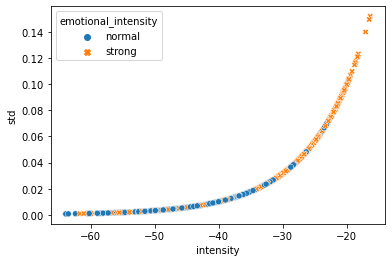

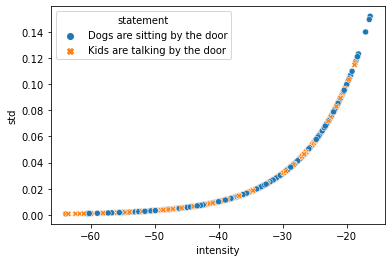

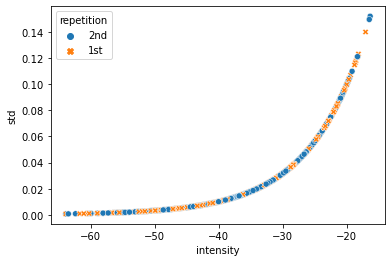

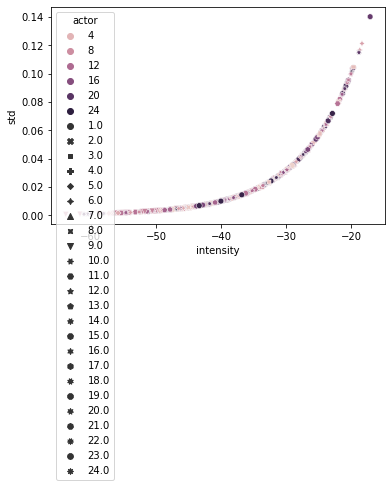

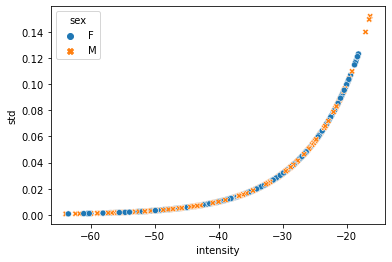

In [95]:
#corr(intensity,std)=0.845
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="intensity", y="std", hue=s, style=s)
  plt.show()

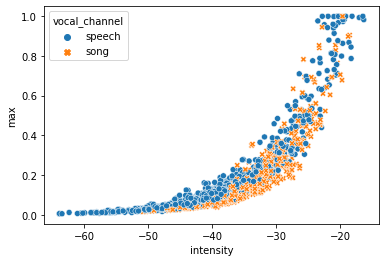

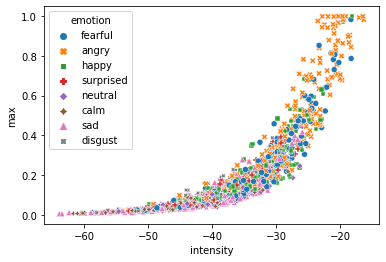

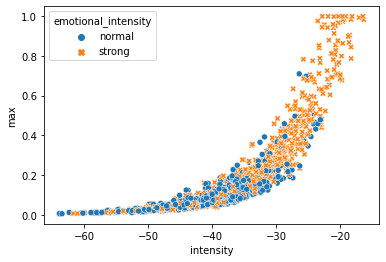

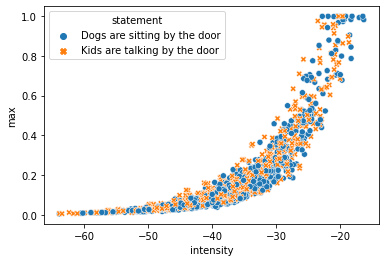

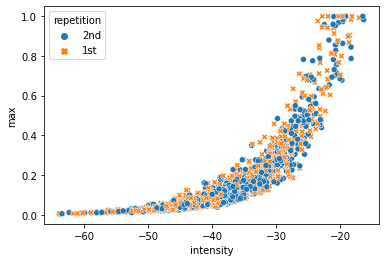

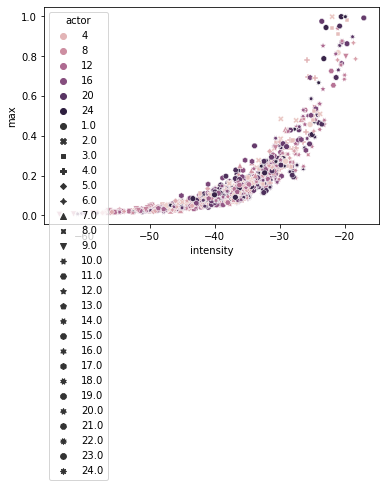

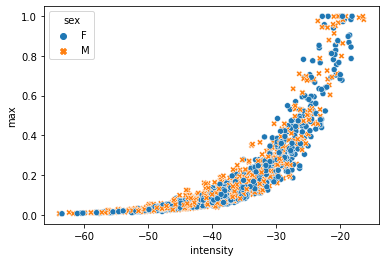

In [96]:
#corr(intensity,max)=0.808
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="intensity", y="max", hue=s, style=s)
  plt.show()

"""
scatter plot tra intensity,max,emotional_intensity ---> a valori di intensità > -30 corrispondo valori in aumento del max interpretati da record con intensità emozionale = strong
"""

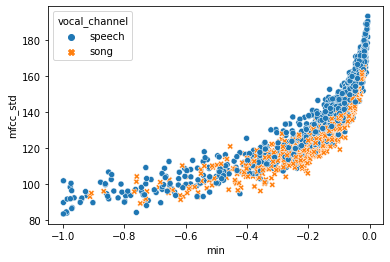

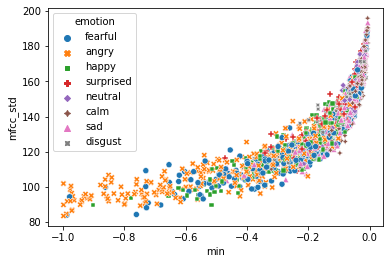

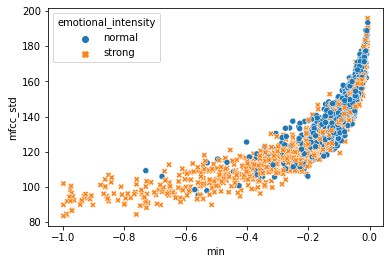

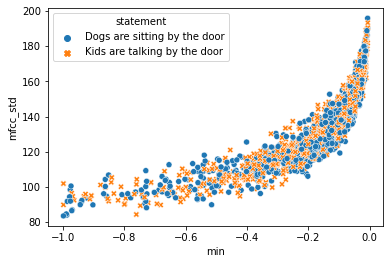

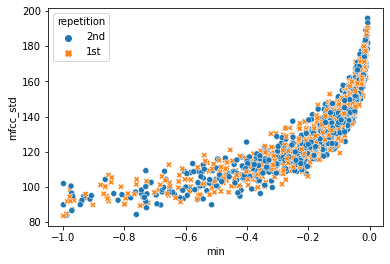

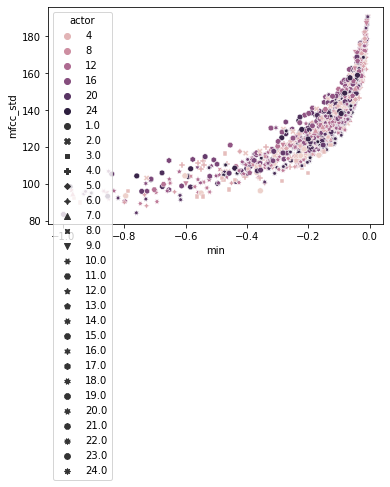

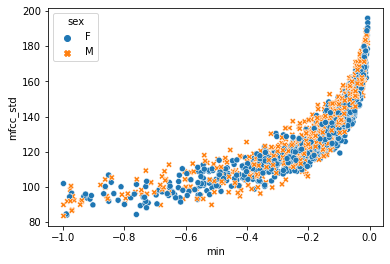

In [97]:
#corr(min,mfcc_std)=0.816
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="min", y="mfcc_std", hue=s, style=s)
  plt.show()

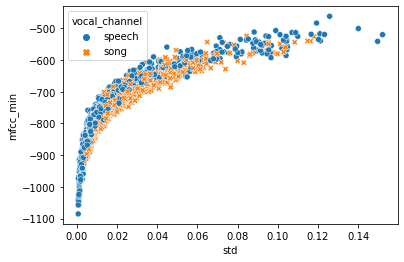

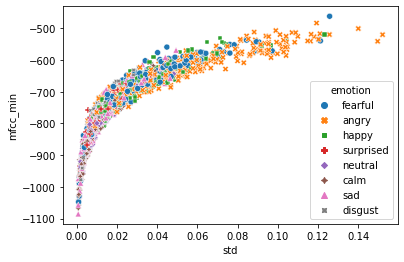

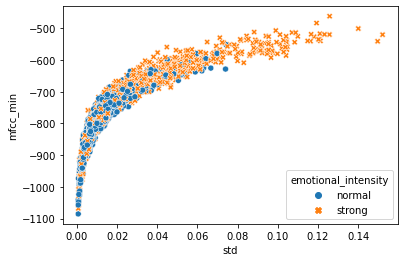

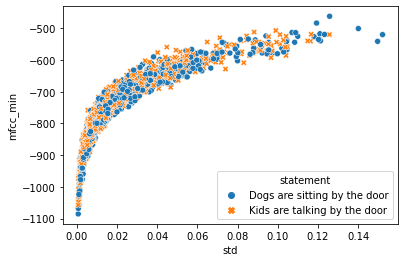

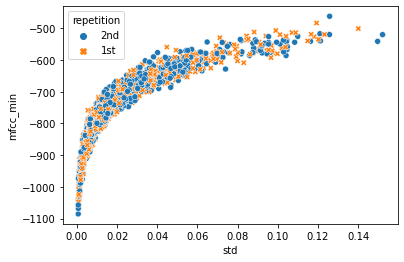

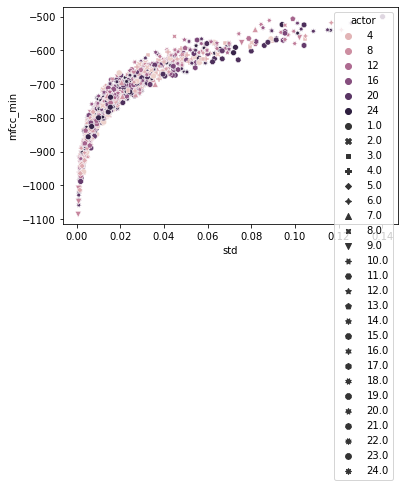

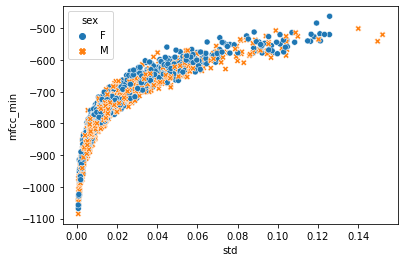

In [98]:
#corr(std,mfcc_min)=0.842
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="std", y="mfcc_min", hue=s, style=s)
  plt.show()

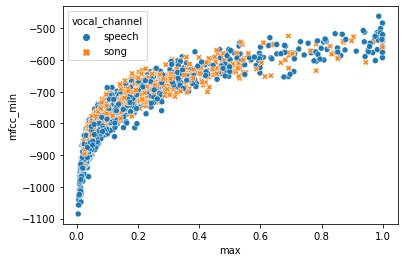

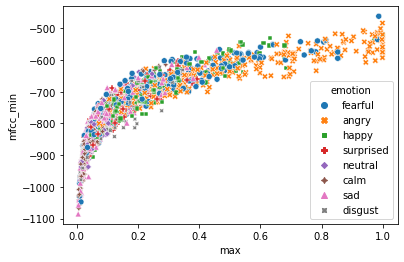

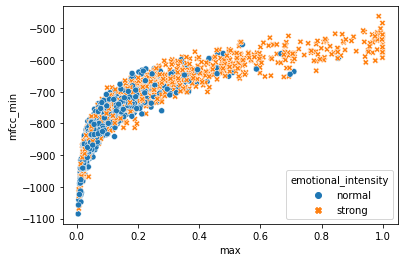

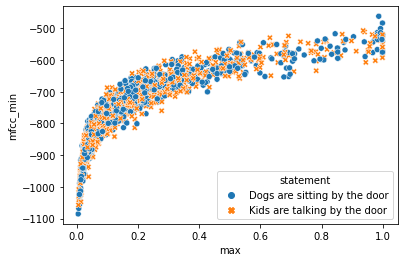

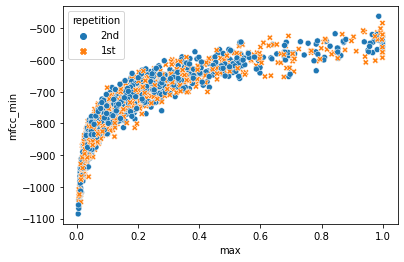

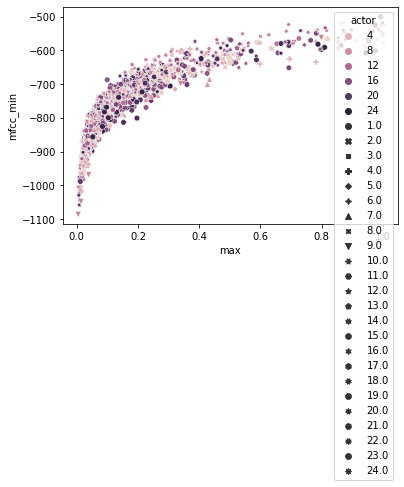

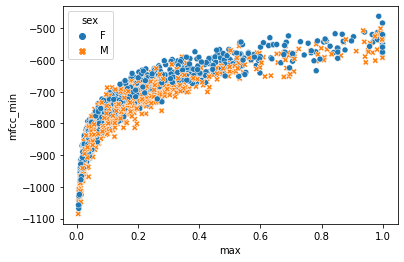

In [99]:
#(Max,Mfcc_min)=0.822
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="max", y="mfcc_min", hue=s, style=s)
  plt.show()

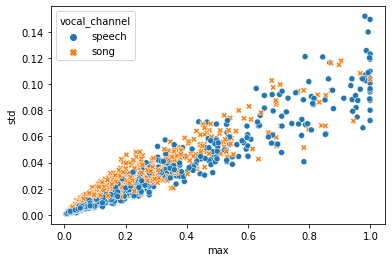

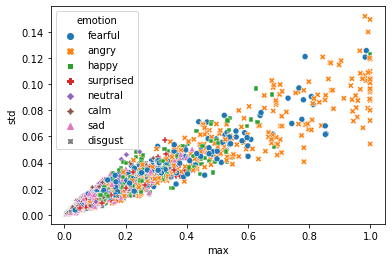

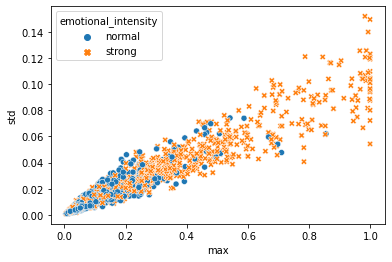

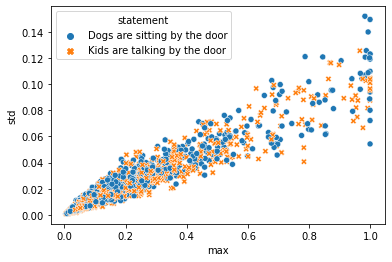

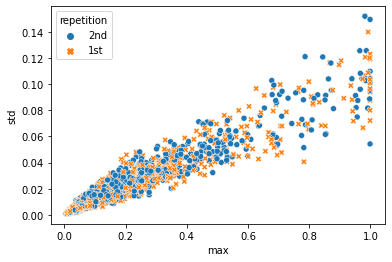

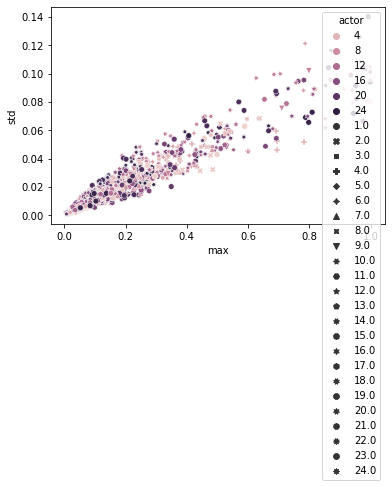

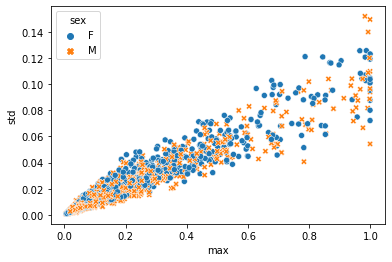

In [100]:
#(Max,std)=0.952
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="max", y="std", hue=s, style=s)
  plt.show()

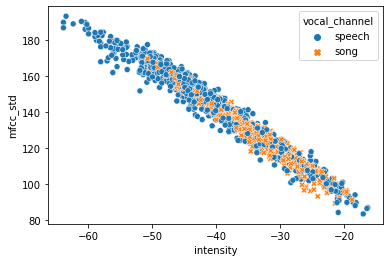

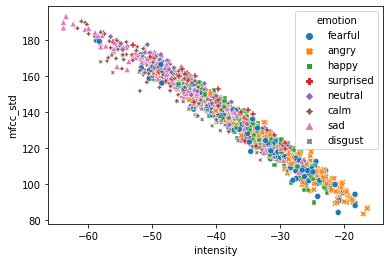

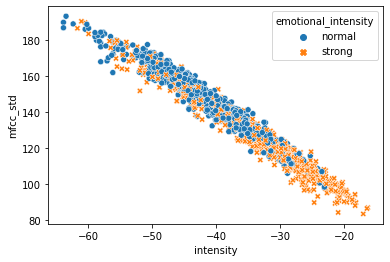

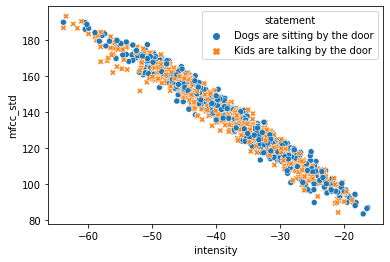

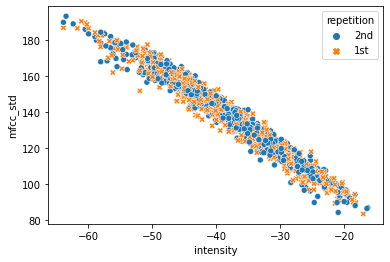

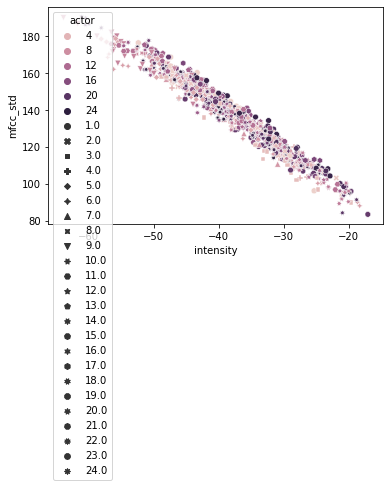

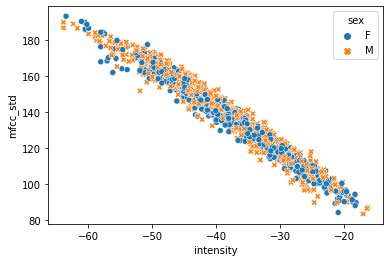

In [101]:
#(intensity,mfcc_std) = -0.97
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="intensity", y="mfcc_std", hue=s, style=s)
  plt.show()

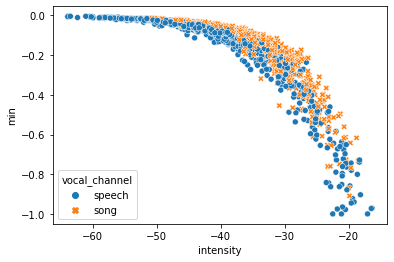

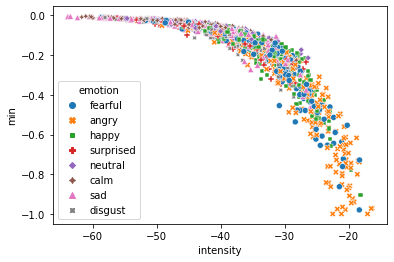

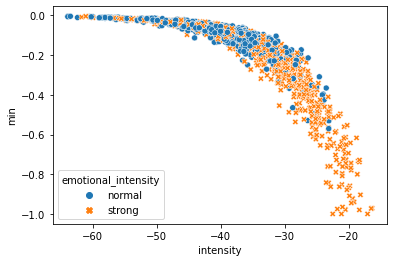

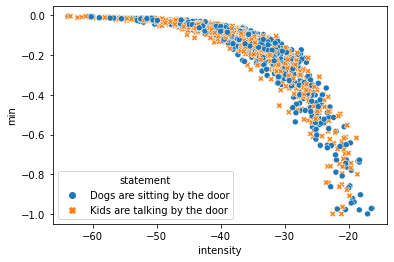

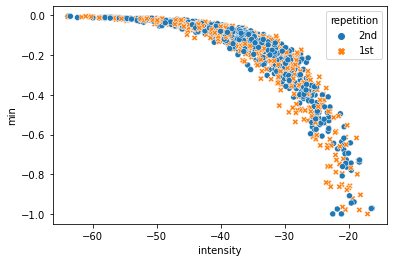

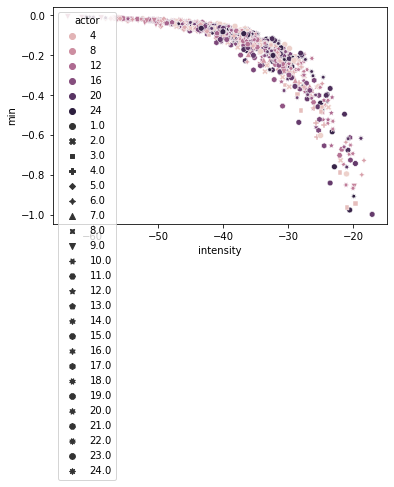

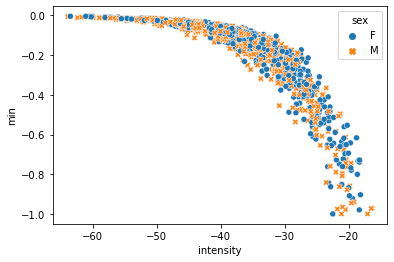

In [102]:
#(intensity , min) = -0.81
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="intensity", y="min", hue=s, style=s)
  plt.show()

"""
scatter plot tra intensity,min,vocal_channel ---> a valori di intensità <-50 corrispondono valori alti di min caratterizzati da record con vocal_channel=parlato
"""

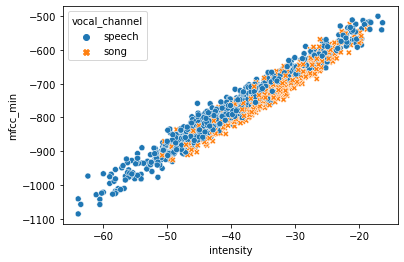

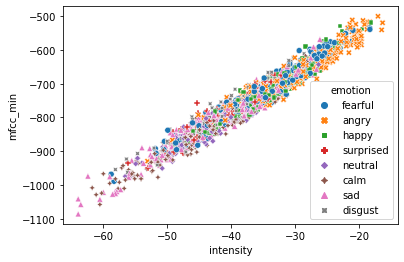

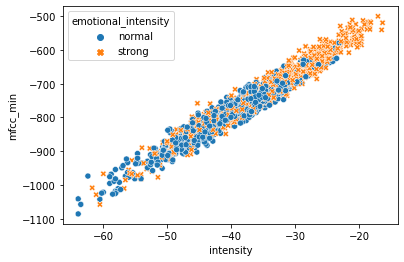

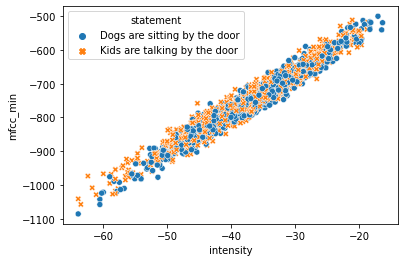

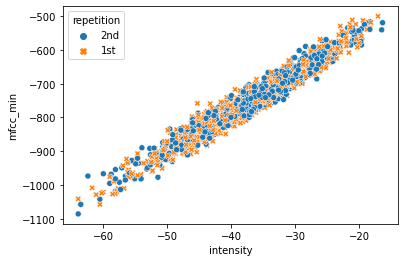

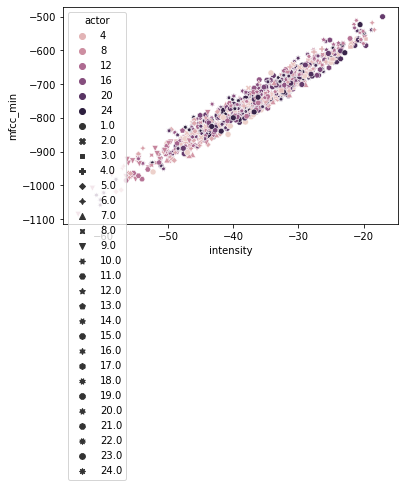

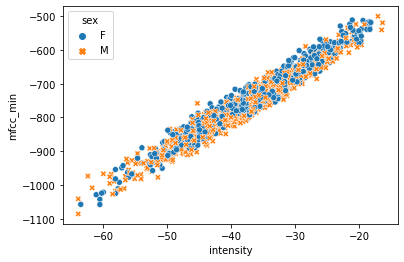

In [103]:
#(intensity ,mfcc_min) = -0.97
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="intensity", y="mfcc_min", hue=s, style=s)
  plt.show()

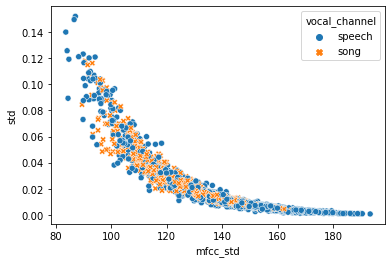

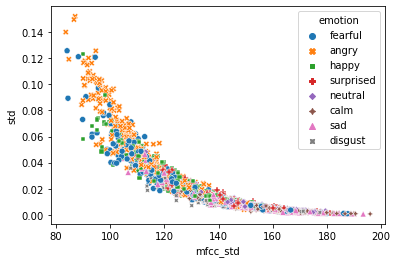

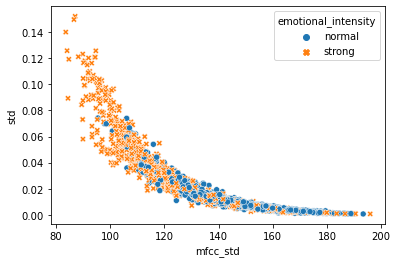

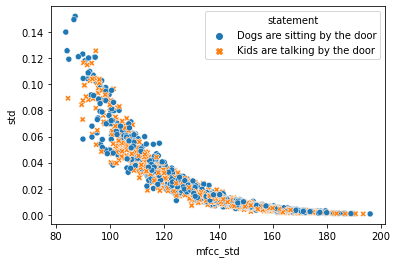

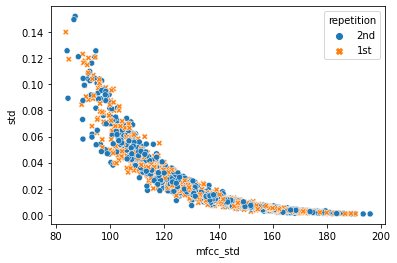

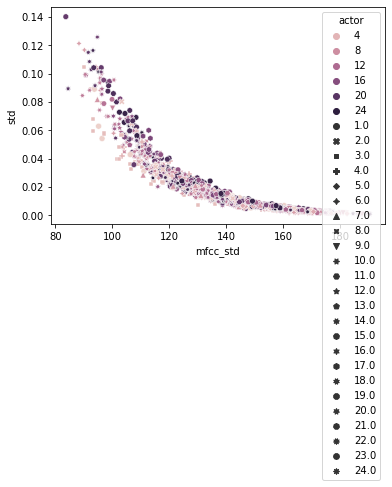

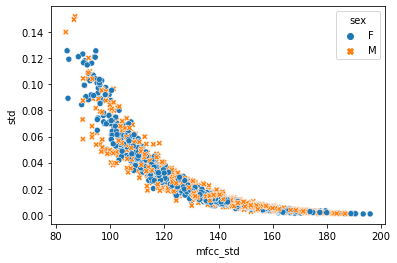

In [104]:
#(mfcc_std,std) = -0.84
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="mfcc_std", y="std", hue=s, style=s)
  plt.show()

"""
scatter plot tra mfcc_std,std,emotional_intensity ---> a valori di mfcc_std <100 corrispondono valori alti di std caratterizzati da record con emotional_intensity =strong
"""

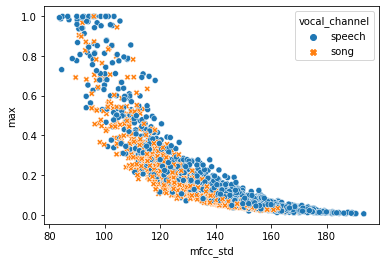

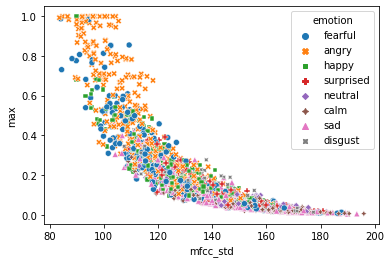

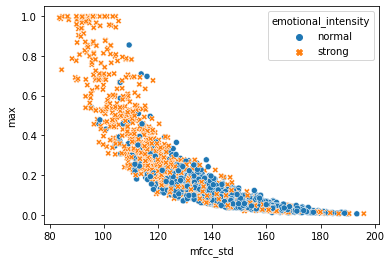

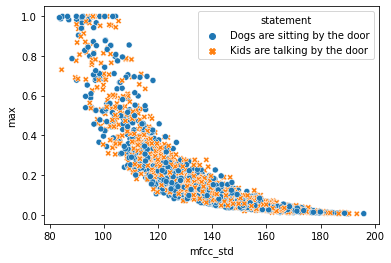

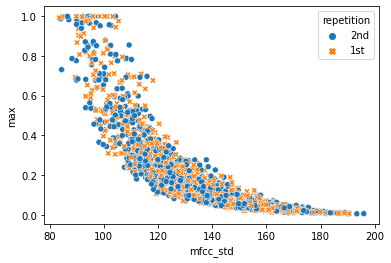

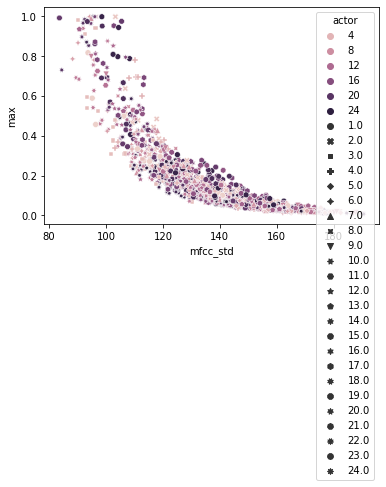

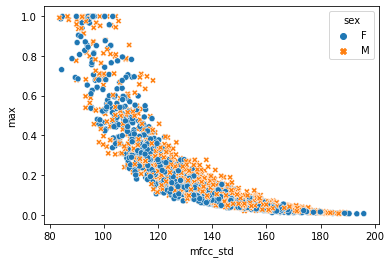

In [105]:
#(mfcc_std,max) = -0.81
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="mfcc_std", y="max", hue=s, style=s)
  plt.show()

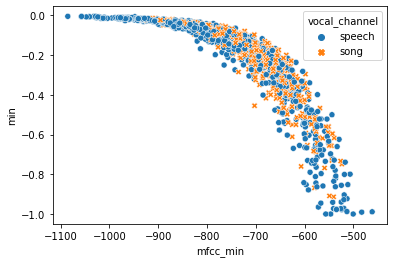

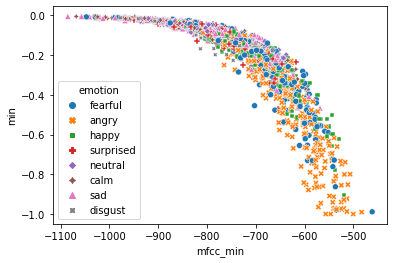

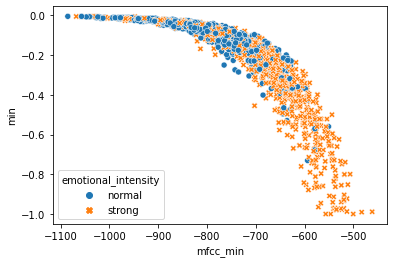

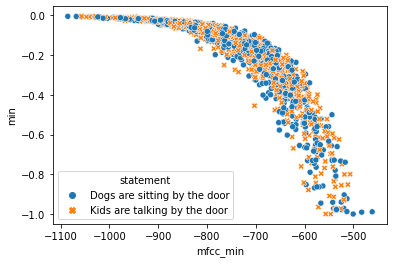

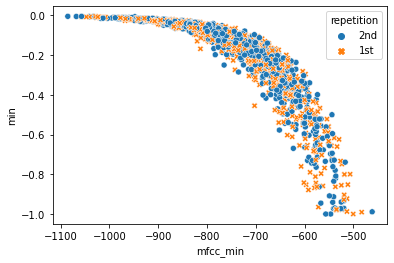

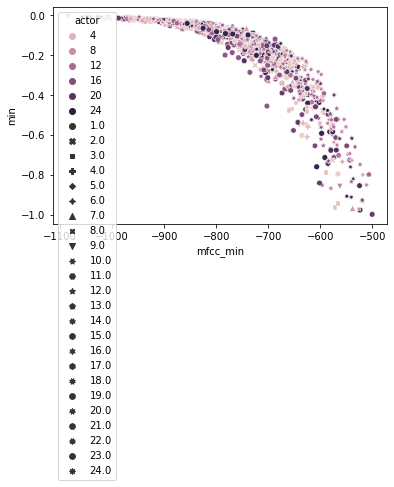

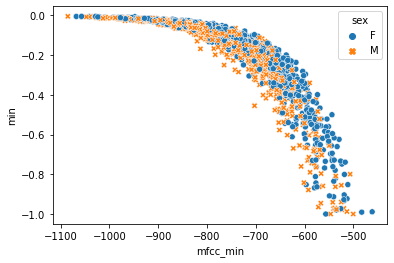

In [106]:
#(mfcc_min,min) = -0.82
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="mfcc_min", y="min", hue=s, style=s)
  plt.show()

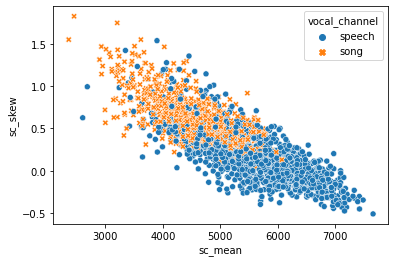

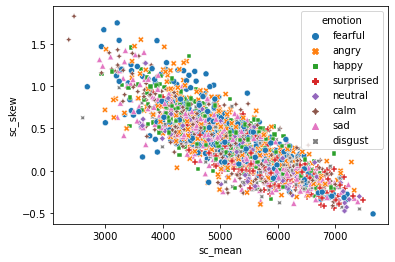

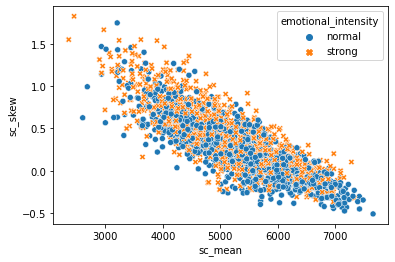

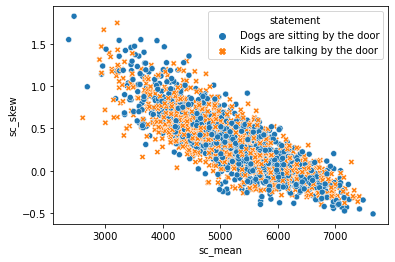

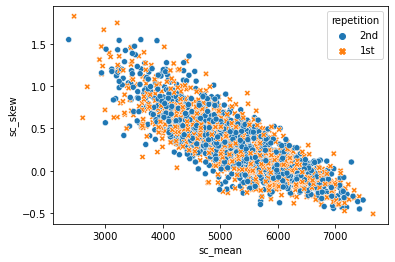

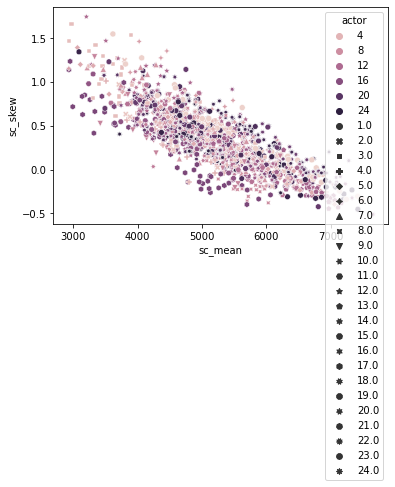

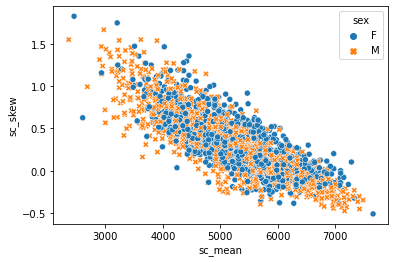

In [107]:
#(sc_mean,sc_skew) = -0.82
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="sc_mean", y="sc_skew", hue=s, style=s)
  plt.show()


SCATTER PLOT AGGIUNTIVI NON DERIVANTI DALLA MATRICE DI CORRELAZIONE(HUE=FEATURES CATEGORICHE)

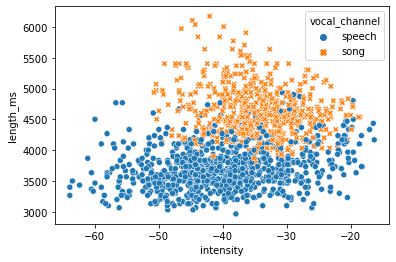

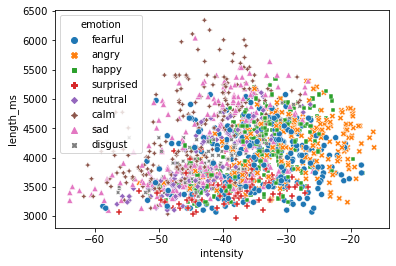

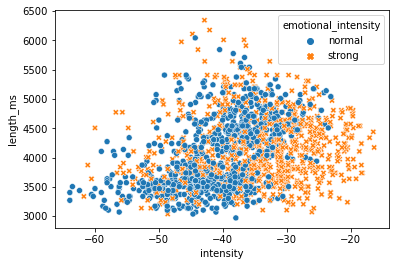

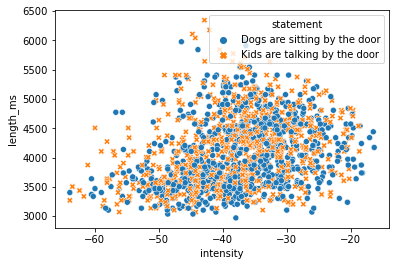

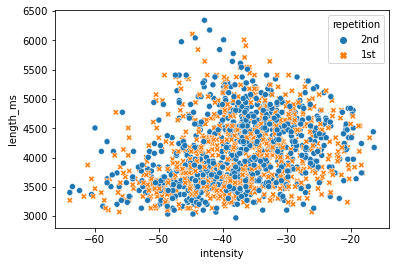

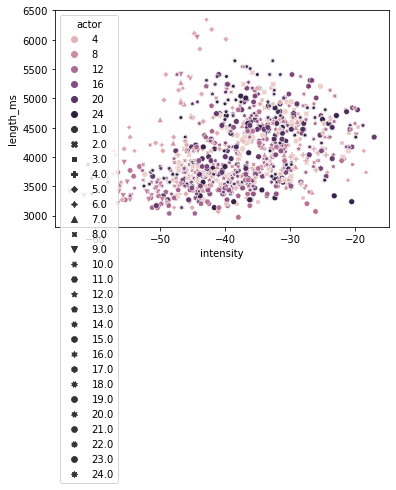

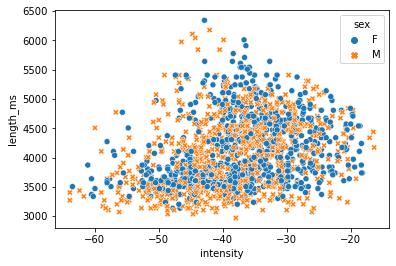

In [108]:
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="intensity", y="length_ms", hue=s, style=s)
  plt.show()

  """
  scatter plot tra intensity.length_ms,voacal_channel ---> la length_ms > 4000 caratterizza record con vocal_channel song, a prescindere dai valori dell intensità
  """

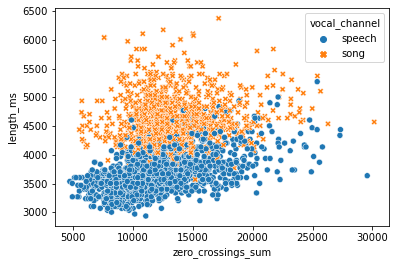

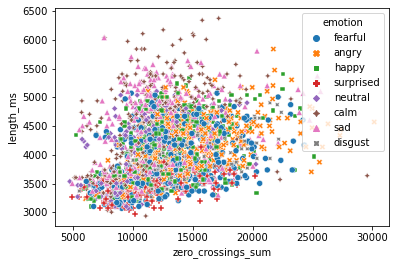

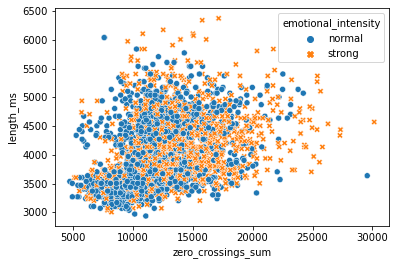

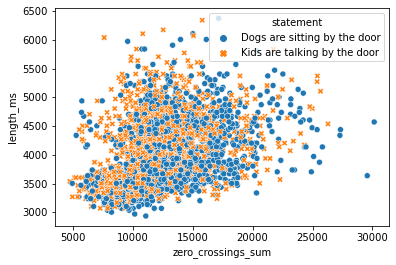

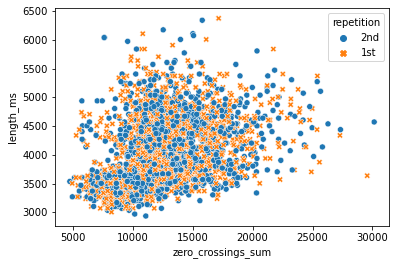

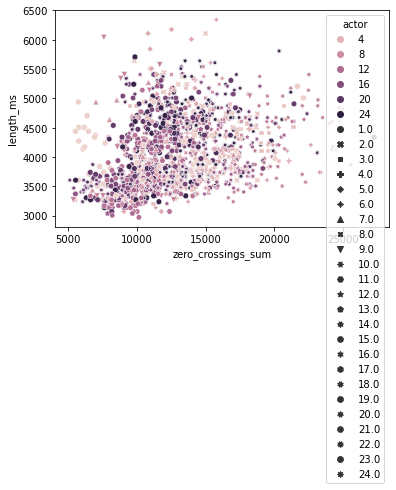

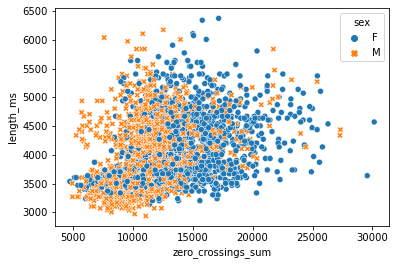

In [109]:
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="zero_crossings_sum", y="length_ms", hue=s, style=s)
  plt.show()

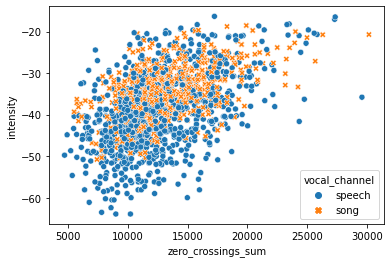

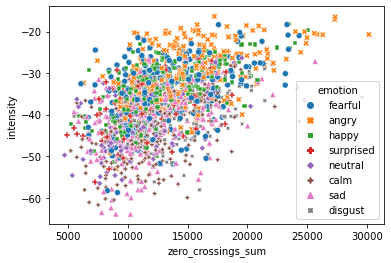

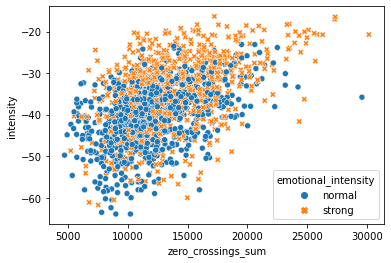

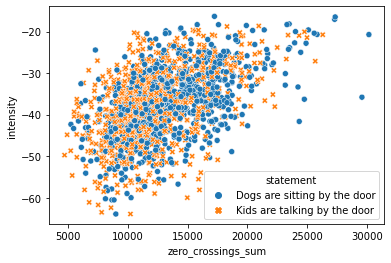

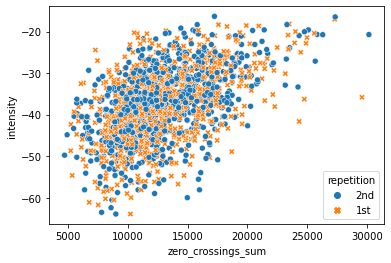

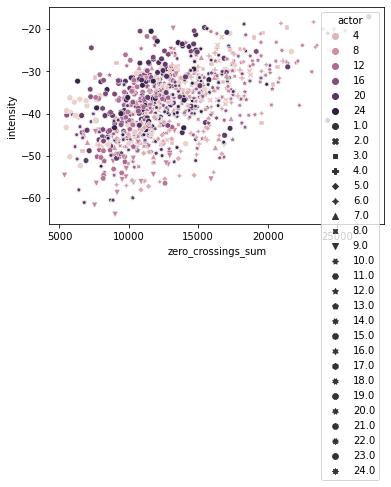

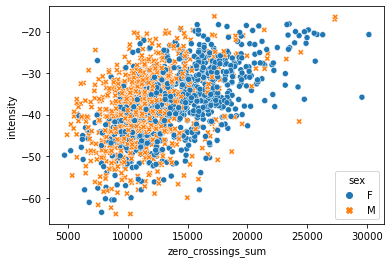

In [110]:
for s in cathegorical_columns:
  sns.scatterplot(data=ravdess_df, x="zero_crossings_sum", y="intensity", hue=s, style=s)
  plt.show()

DENSITA' VARIABILI CONTINUE CON HUE=VARIABILI CATEGORICHE

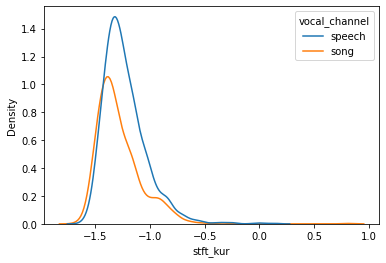

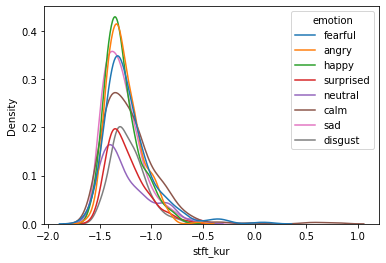

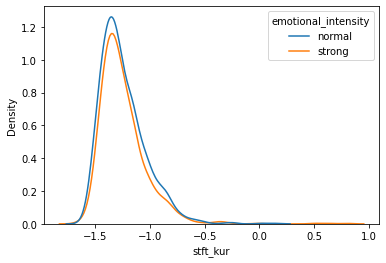

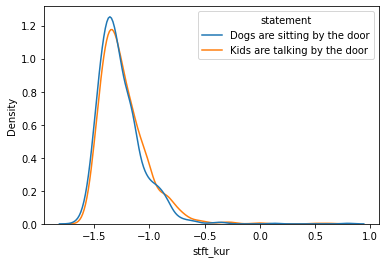

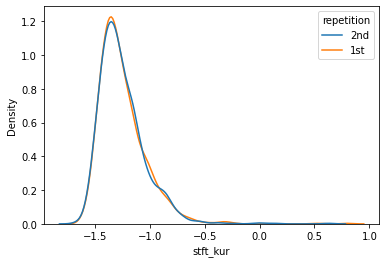

...

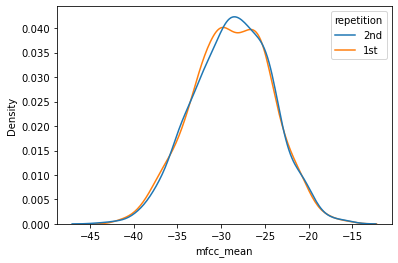

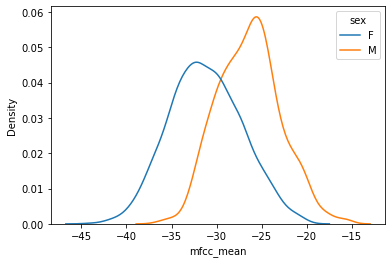

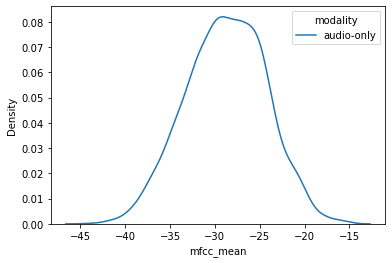

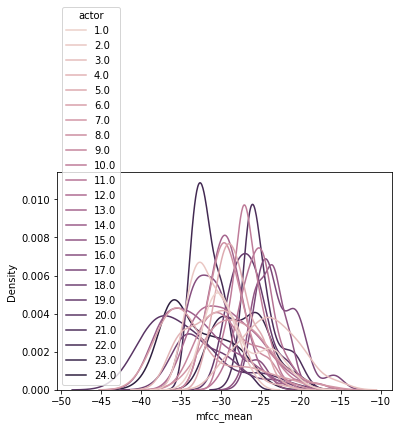

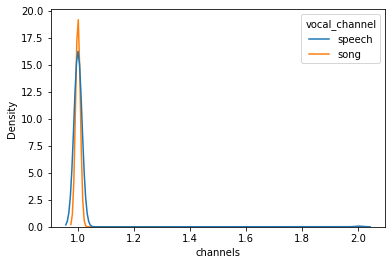

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


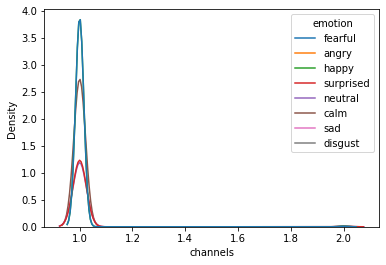

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


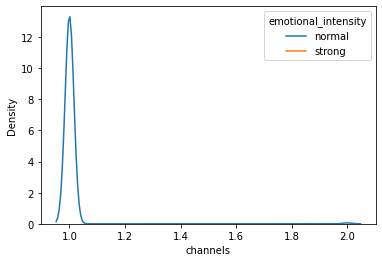

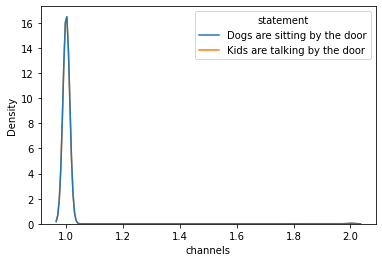

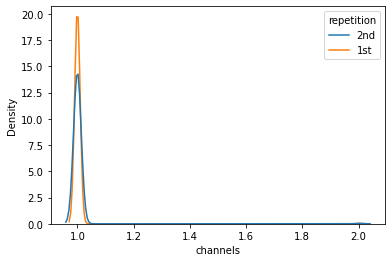

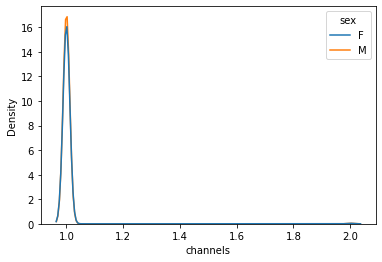

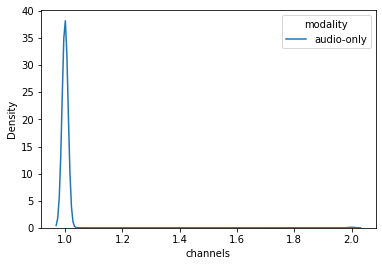

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


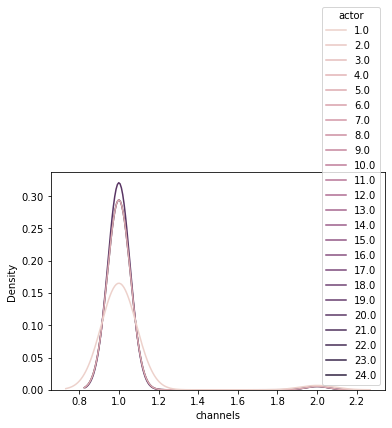

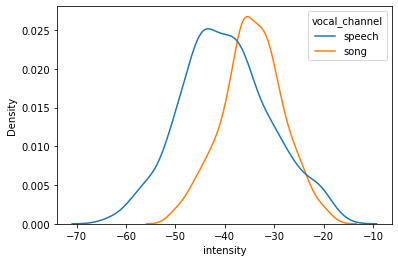

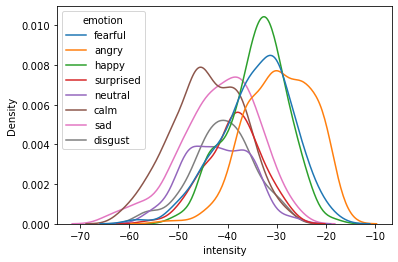

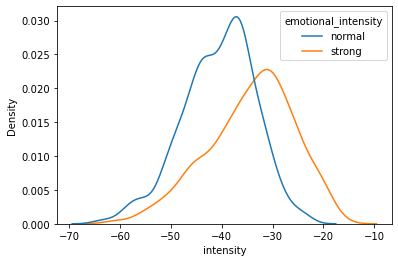

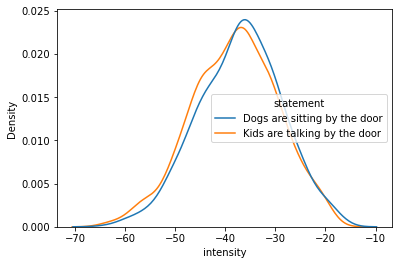

...

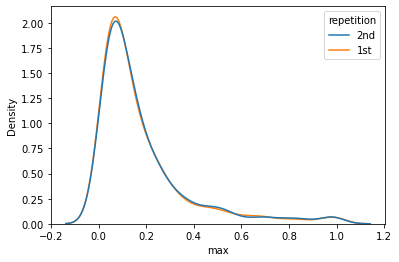

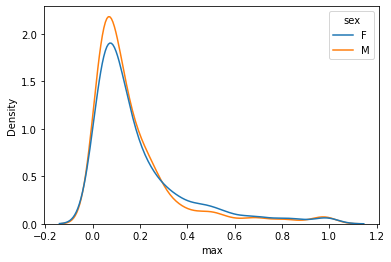

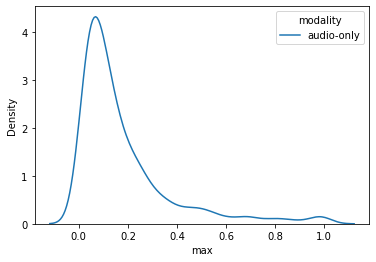

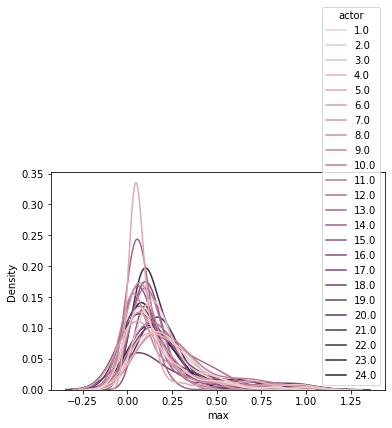

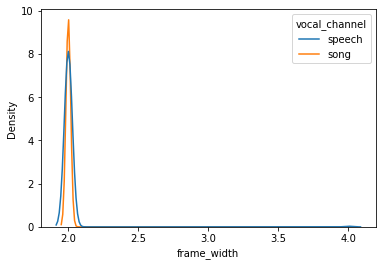

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


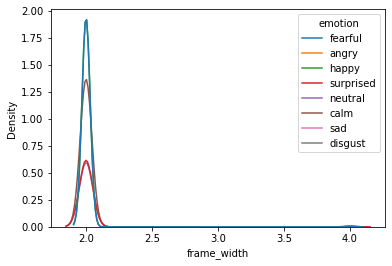

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


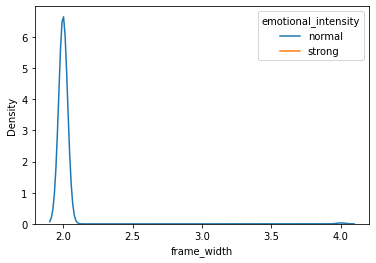

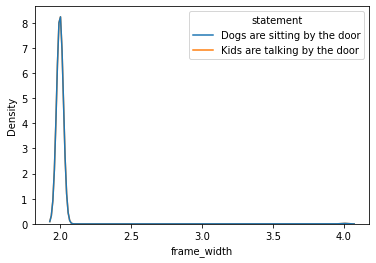

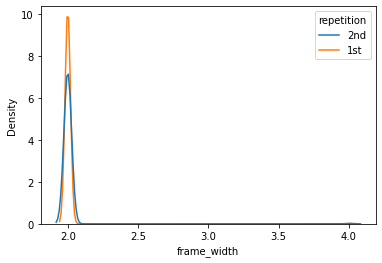

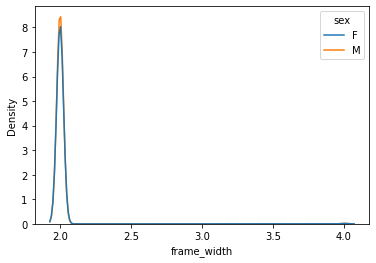

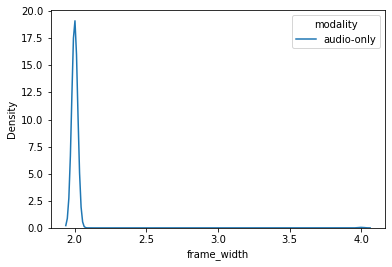

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)
d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


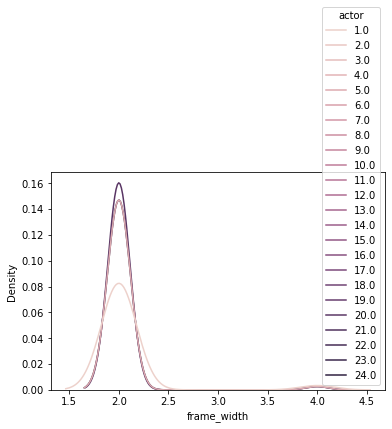

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


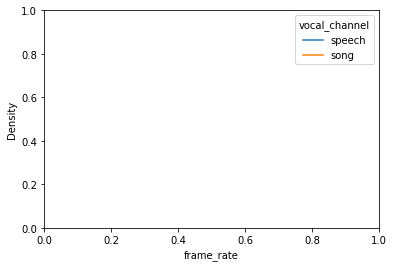

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


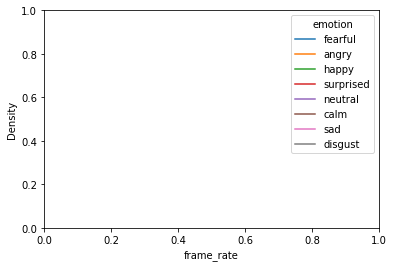

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


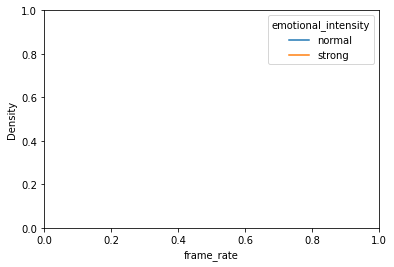

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


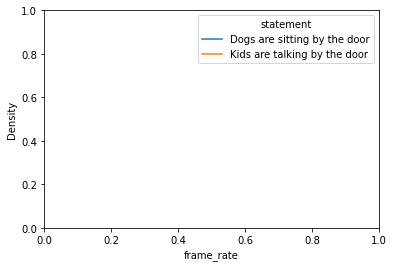

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


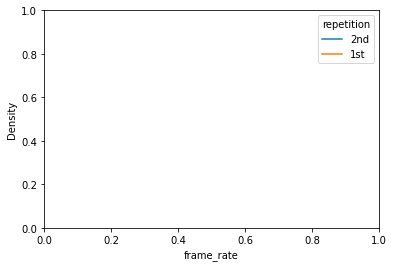

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


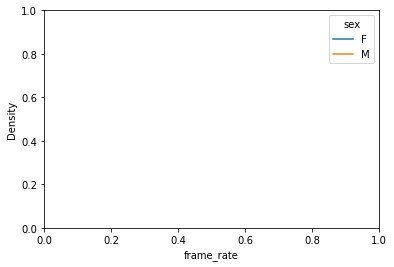

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


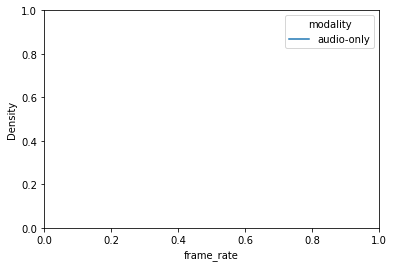

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


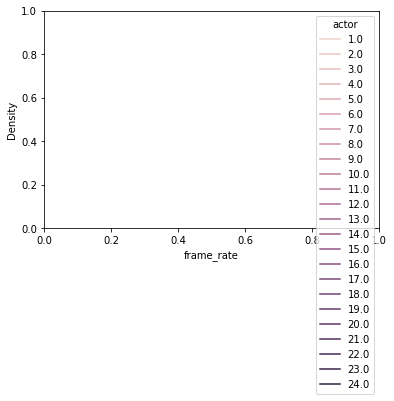

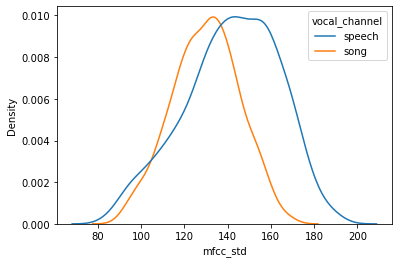

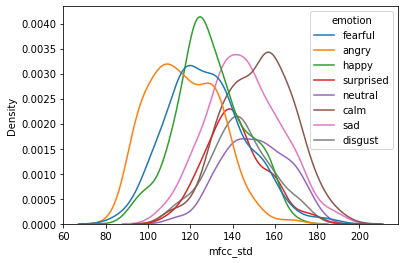

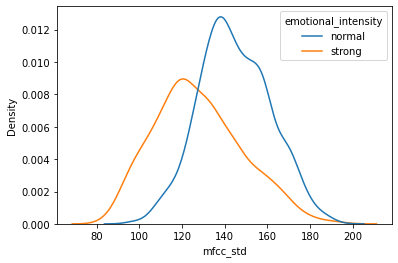

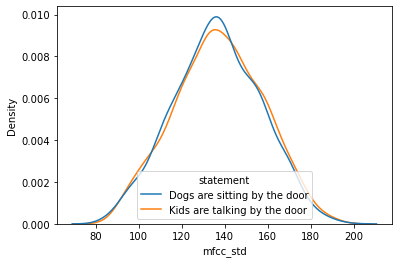

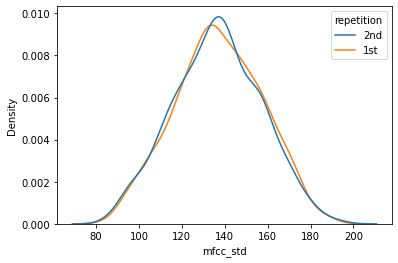

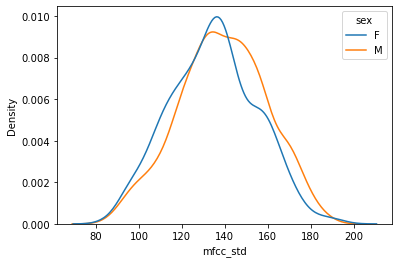

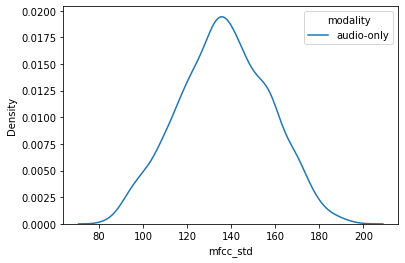

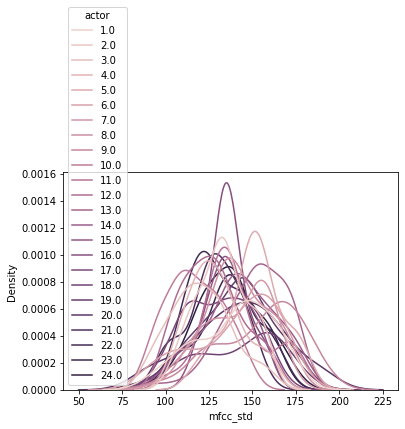

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


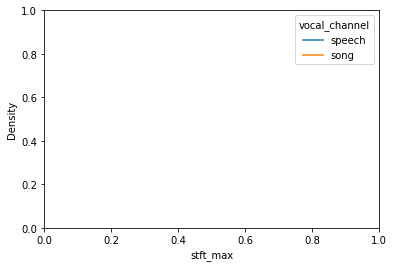

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


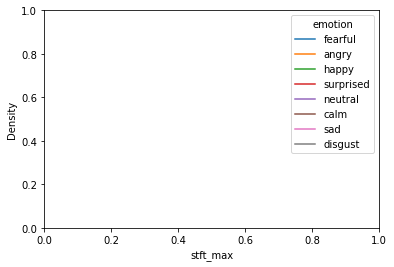

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


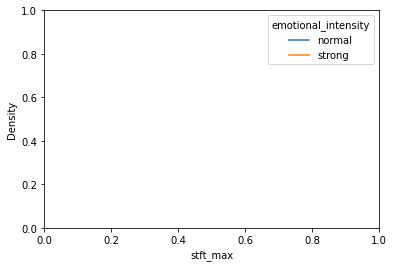

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


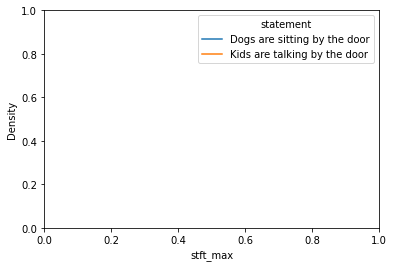

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


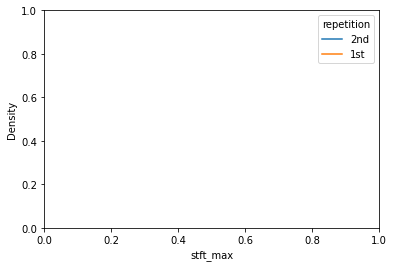

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


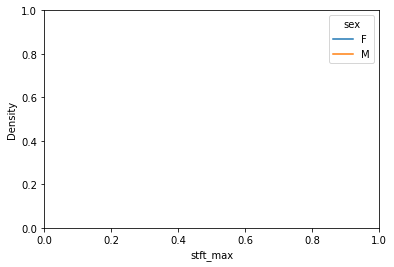

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


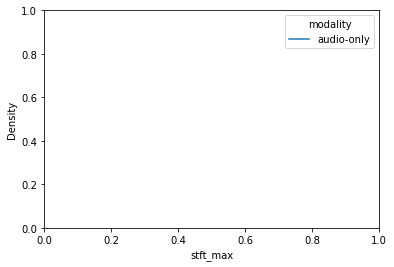

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


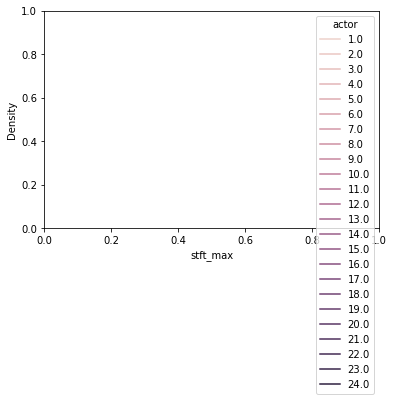

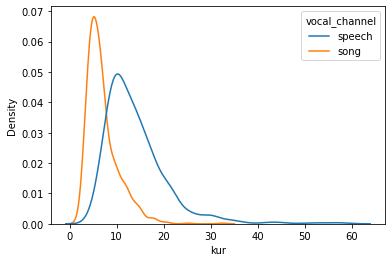

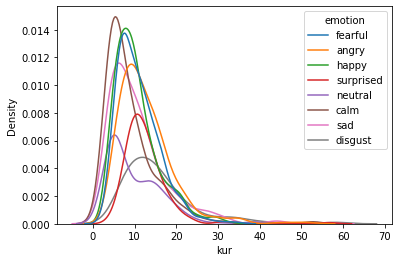

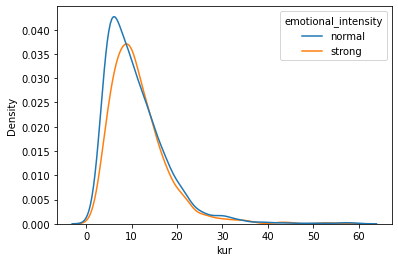

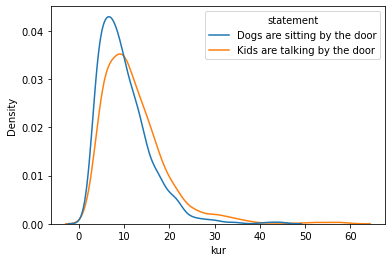

...

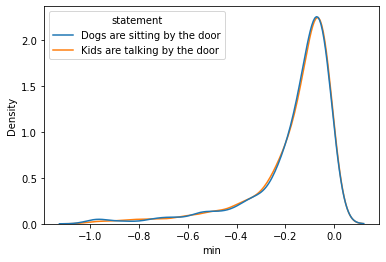

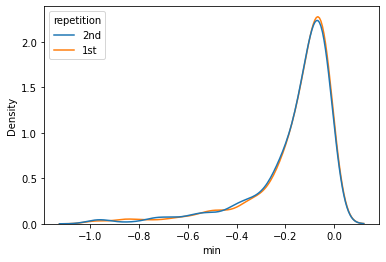

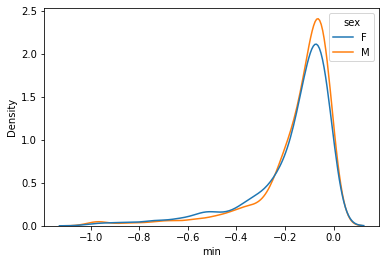

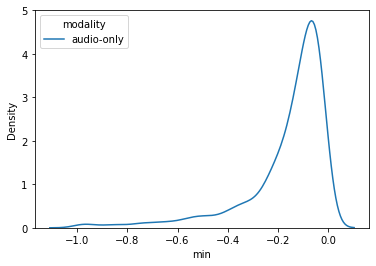

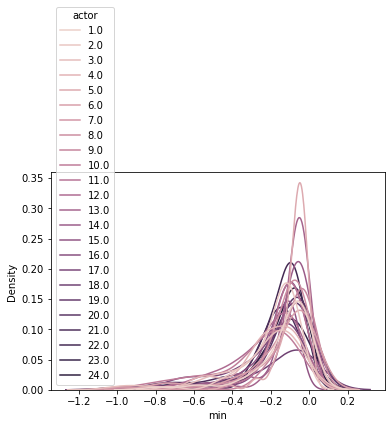

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


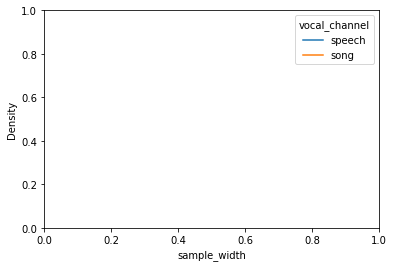

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


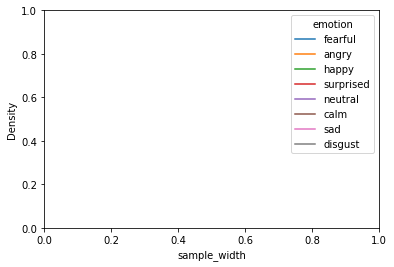

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


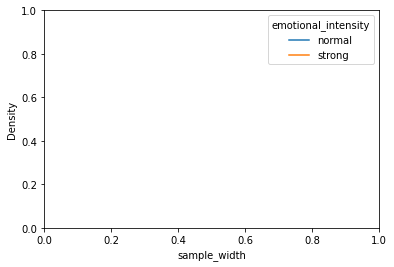

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


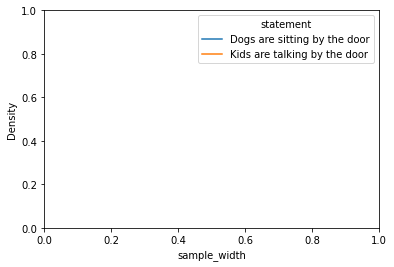

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


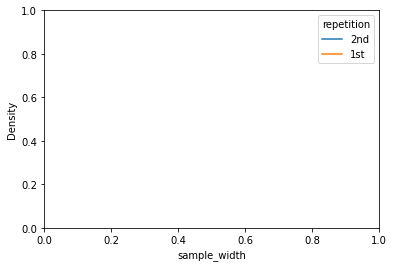

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


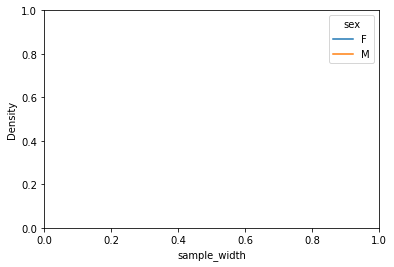

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


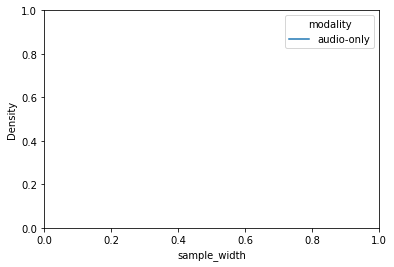

d:\Anaconda\lib\site-packages\seaborn\distributions.py:316: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  warnings.warn(msg, UserWarning)


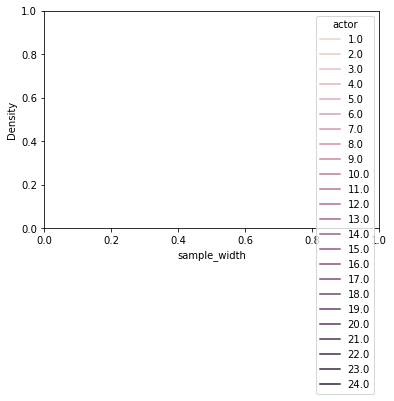

In [111]:
# NON CREDO SIA MOLTO UTILE QUESTO SCRIPT, MA AL MOMENTO LO INSERISCO IN FONDO AL NOTEBOOK


colonne_categoriche = ['vocal_channel','emotion','emotional_intensity','statement','repetition','sex','modality','actor']
colonne = ravdess_df.columns
colonne_continue = set(colonne)-set(colonne_categoriche)

for z in colonne_continue:
  for  s in  colonne_categoriche:
    sns.kdeplot(data=ravdess_df, x=z, hue=s)
    plt.show()


################################################################################################################

# DATA PREPARATION

In [112]:
#  Per la fase di data preparation verrà creato un nuovo file prepared_ravdess.csv contenente il datased modificato
# Ad ora limitiamoci a creare solamente un dataframe preparato appositamente per le future operazioni di clustering

prepared_ravdess_df=ravdess_df.copy()
prepared_ravdess_df

,modality,vocal_channel,emotion,emotional_intensity,statement,repetition,actor,sex,channels,sample_width,...,stft_min,stft_max,stft_kur,stft_skew,mean,std,min,max,kur,skew
0,audio-only,speech,fearful,normal,Dogs are sitting by the door,2nd,2.0,F,1,2,...,0.000000,1.0,-1.215025,0.403514,3.844916e-07,0.014482,-0.128632,0.138947,9.406061,0.273153
1,audio-only,speech,angry,normal,Dogs are sitting by the door,1st,16.0,F,1,2,...,0.000000,1.0,-1.384174,0.290905,-7.149491e-08,0.020417,-0.305725,0.263062,19.564187,0.292157
2,audio-only,NaN,happy,strong,Dogs are sitting by the door,2nd,16.0,F,1,2,...,0.000000,1.0,-1.242947,0.470350,2.429985e-06,0.024317,-0.137482,0.166351,4.881241,0.302659
3,audio-only,NaN,surprised,normal,Kids are talking by the door,1st,14.0,F,1,2,...,0.000000,1.0,-1.445318,0.274756,2.373929e-07,0.003561,-0.027374,0.024078,13.040259,-0.081014
4,audio-only,song,happy,strong,Dogs are sitting by the door,2nd,2.0,F,1,2,...,0.000000,1.0,-1.366742,0.318926,8.454691e-07,0.027522,-0.192169,0.242676,7.485109,0.414872
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2447,audio-only,speech,calm,strong,Kids are talking by the door,1st,23.0,M,1,2,...,0.000000,1.0,-1.075888,-0.310088,9.367040e-07,0.005260,-0.039856,0.052399,9.551363,0.759247
2448,audio-only,speech,calm,normal,Dogs are sitting by the door,1st,23.0,M,1,2,...,0.000000,1.0,-1.026071,-0.408018,4.614221e-07,0.006836,-0.064178,0.084045,22.517991,1.073633
2449,audio-only,song,sad,strong,Dogs are sitting by the door,2nd,23.0,M,1,2,...,0.000000,1.0,-1.473789,0.130310,-8.219263e-06,0.015384,-0.093079,0.097260,4.964319,-0.005821
2450,audio-only,speech,surprised,normal,Kids are talking by the door,1st,NaN,M,1,2,...,0.001565,1.0,-1.277117,-0.242668,-4.400898e-06,0.005182,-0.057556,0.052002,13.855588,-0.110966
